## 1. Importing libraries, loading song and genre data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import time
import surprise
from surprise import Reader,Dataset
from collections import defaultdict
import os
from sklearn.preprocessing import LabelEncoder
from collections import Counter
import numpy as np
import pickle
import torch.optim as optim
import torch
import torch.nn as nn
import torch.utils.data as Data
import recmetrics
from recmetrics import rmse,recommender_precision,recommender_recall
from sklearn.model_selection import train_test_split
import recommenders
from recommenders.models.ncf.ncf_singlenode import NCF
from  recommenders.models.deeprec.models.graphrec.lightgcn import LightGCN
from recommenders.models.ncf.dataset import Dataset as NCFDataset
from recommenders.models.deeprec.DataModel.ImplicitCF import ImplicitCF
from recommenders.evaluation.python_evaluation import rmse, precision_at_k, recall_at_k
from recommenders.models.deeprec.deeprec_utils import prepare_hparams
from recommenders.utils.constants import SEED as DEFAULT_SEED
from recommenders.datasets.python_splitters import python_stratified_split
from recommenders.utils.timer import Timer
from recommenders.models.rbm.rbm import RBM
from recommenders.datasets.python_splitters import numpy_stratified_split
from recommenders.datasets.sparse import AffinityMatrix

In [2]:
song_df = pd.read_csv('Dataset\song-attributes.txt', sep="\t", header=None)
song_df.columns = ['song_id', 'album_id', 'artist_id', 'genre_id']
song_df.head()

,song_id,album_id,artist_id,genre_id
0,0,12070,8490,0
1,1,19512,7975,134
2,2,18953,3492,0
3,3,695,2653,0
4,4,243,2282,0


In [3]:
genre_df = pd.read_csv('Dataset\genre-hierarchy.txt', sep="\t", header=None)
genre_df.columns = ['genre_id','parent_genre_id','level','genre_name']
genre_df.head()

,genre_id,parent_genre_id,level,genre_name
0,0,0,1,Unknown
1,1,1,1,Electronic/Dance
2,2,1,2,Ambient
3,3,2,3,Ambient Dub
4,4,2,3,Ambient Tech


## 2. Matching songs to primary genres

The songs in the dataset follow an hierarchical structure with 3 levels. For example, the Electronic/Dance genre has many sub-genres, as illustrated in the following image:  
<img src="electronic_dance_hierarchy.png" alt="Drawing" style="width: 1000px;"/>

In the following code we map all the songs to the primary genres which are at the top of the hierarchy.

In [4]:
genre_primary_ids = []
genre_primary_names = []

for _,item in genre_df.iterrows():
    if(item['level'] == 1):
        genre_primary_ids.append(item['genre_id'])
        genre_primary_names.append(item['genre_name'])
    elif(item['level'] == 2):
        genre_primary_ids.append(item['parent_genre_id'])
        genre_primary_names.append(genre_df[genre_df['genre_id'] == int(item['parent_genre_id'])]['genre_name'].values[0])
    elif(item['level'] == 3):
        level_2_genre_df = genre_df[genre_df['genre_id'] == int(item['parent_genre_id'])]        
        genre_primary_ids.append(level_2_genre_df['parent_genre_id'].values[0])
        genre_primary_names.append(genre_df[genre_df['genre_id'] == int(level_2_genre_df['parent_genre_id'])]['genre_name'].values[0])

In [5]:
genre_df['genre_primary_id'] = genre_primary_ids
genre_df['genre_primary_name'] = genre_primary_names

In [6]:
genre_df.head()

,genre_id,parent_genre_id,level,genre_name,genre_primary_id,genre_primary_name
0,0,0,1,Unknown,0,Unknown
1,1,1,1,Electronic/Dance,1,Electronic/Dance
2,2,1,2,Ambient,1,Electronic/Dance
3,3,2,3,Ambient Dub,1,Electronic/Dance
4,4,2,3,Ambient Tech,1,Electronic/Dance


In [7]:
song_genre = pd.merge(song_df, genre_df[['genre_id','genre_primary_id','genre_primary_name']], on="genre_id", how="left");
song_genre.drop('genre_id',axis=1,inplace=True)

In [8]:
song_genre.head()

,song_id,album_id,artist_id,genre_primary_id,genre_primary_name
0,0,12070,8490,0,Unknown
1,1,19512,7975,134,Rock
2,2,18953,3492,0,Unknown
3,3,695,2653,0,Unknown
4,4,243,2282,0,Unknown


In [9]:
unknown_type_songs = song_genre[song_genre['genre_primary_name'] == 'Unknown'].shape[0]
overall_songs = song_genre.shape[0]
print("%d of the overall %d songs are of unknown type (%f%%)."%(unknown_type_songs,overall_songs,100*unknown_type_songs/overall_songs))


118294 of the overall 136736 songs are of unknown type (86.512696%).


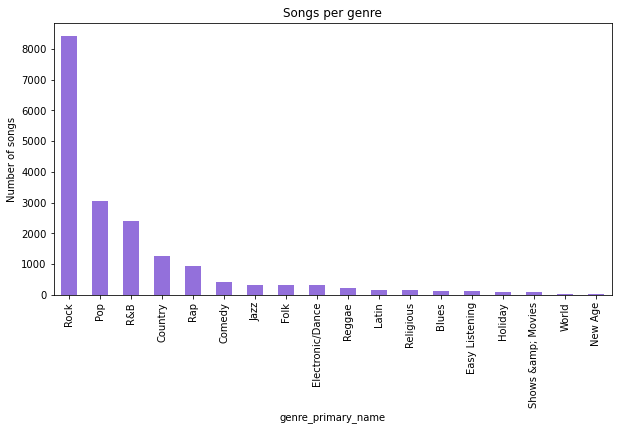

In [10]:
song_genre_known = song_genre[song_genre['genre_primary_name'] != 'Unknown']
song_genre_known = song_genre_known.groupby(['genre_primary_name'])['genre_primary_name'].count().sort_values(ascending=False)
song_genre_known.plot(kind = 'bar',figsize = (10, 5),color = 'mediumpurple',title='Songs per genre',ylabel='Number of songs');

## 3. User-oriented analysis

## 3.1 Ratings of a user

In [11]:
user = int(input("Type a user_id (0-1823178): "))
if(user < 0 or user > 1823178):
    print("[ERROR] Invalid user!")
    

user_list = []
file_num = int(user/200000)

with open("Dataset/train_%d.txt"%(file_num),"r") as f:
    while True:
        line = next(f)
        if(int(line.split()[0]) == user):
            user_list.append(line.split())
        elif(int(line.split()[0]) > user):
            break

user_df = pd.DataFrame(user_list,columns=['user_id','song_id','rating'])
user_df.head()

Type a user_id (0-1823178): 2


,user_id,song_id,rating
0,2,273,4
1,2,316,3
2,2,901,4
3,2,1713,2
4,2,1815,2


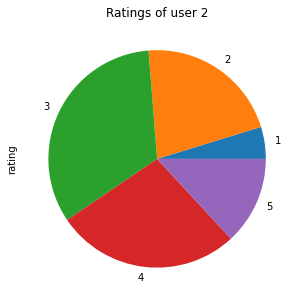

In [12]:
user_ratings = user_df.groupby(['rating'])['rating'].count()
user_ratings.plot(kind='pie',figsize=(10,5),title='Ratings of user %d'%(user));

## 3.2 Genre preferences of a user

In [13]:
user_df['song_id'] = user_df['song_id'].astype(str).astype(int)
user_song_genre_df = pd.merge(user_df,song_genre,on='song_id', how='left')
user_song_genre_df.head()

,user_id,song_id,rating,album_id,artist_id,genre_primary_id,genre_primary_name
0,2,273,4,20452,2988,0,Unknown
1,2,316,3,20492,3536,0,Unknown
2,2,901,4,2081,3994,0,Unknown
3,2,1713,2,8376,5503,54,Country
4,2,1815,2,3616,7950,0,Unknown


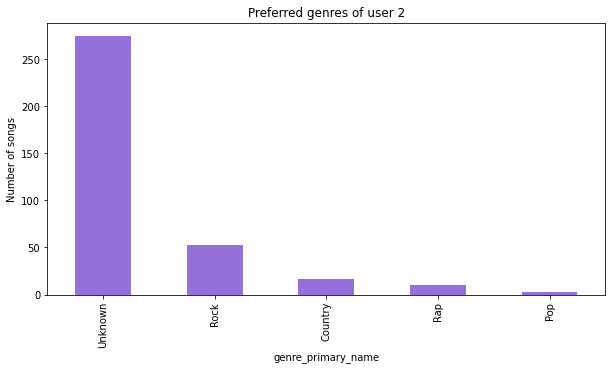

In [14]:
user_genre_prefs = user_song_genre_df.groupby(['genre_primary_name'])['genre_primary_name'].count().sort_values(ascending=False)
user_genre_prefs.plot(kind='bar',figsize=(10,5),color='mediumpurple',title='Preferred genres of user %d'%(user),ylabel='Number of songs');

## 3.3 Album preferences of a user

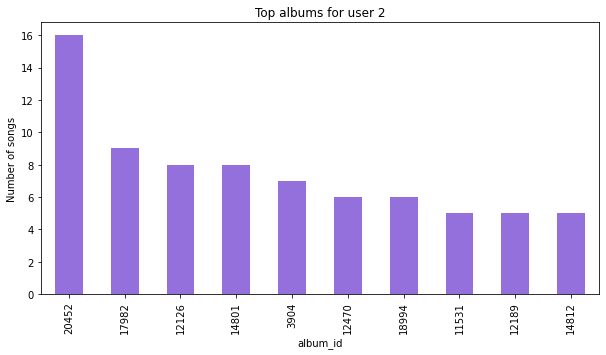

In [15]:
user_album_prefs = user_song_genre_df.groupby(['album_id'])['album_id'].count().nlargest(n=10, keep='first')
user_album_prefs.plot(kind='bar',figsize=(10,5),color='mediumpurple',title='Top albums for user %d'%(user),ylabel='Number of songs');

## 3.4 Artist preferences of a user


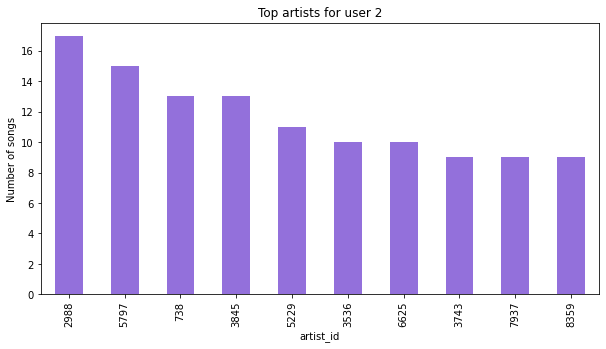

In [16]:
user_artist_prefs = user_song_genre_df.groupby(['artist_id'])['artist_id'].count().nlargest(n=10, keep='first')
user_artist_prefs.plot(kind='bar',figsize=(10,5),color='mediumpurple',title='Top artists for user %d'%(user),ylabel='Number of songs');

## 4. Song-oriented analysis

## 4.1 Song information

In [17]:
song = int(input("Type a song_id (0-136735): "))
if(song < 0 or user > song):
    print("[ERROR] Invalid song!")

song_data = song_genre[song_genre['song_id'] == song]
print('Song id: ',song)
print('Album id: ',song_data['album_id'].iloc[0])
print('Artist id: ',song_data['artist_id'].iloc[0])
print('Primary genre: ',song_data['genre_primary_name'].iloc[0])

Type a song_id (0-136735): 10
Song id:  10
Album id:  14464
Artist id:  6069
Primary genre:  Unknown


## 4.2 Ratings of a song

In [18]:
song_list = [0]*5

for file_num in tqdm(range(10),desc="Loading song ratings..."):
    with open("Dataset/train_%d.txt"%(file_num),"r") as f:
        while True:
            line = f.readline()
            if not line:
                break
            if(int(line.split()[1]) == song):
                song_list[int(line.split()[2])-1]+=1

Loading song ratings...: 100%|█████████████████████████████████████████████████████████| 10/10 [12:36<00:00, 75.68s/it]


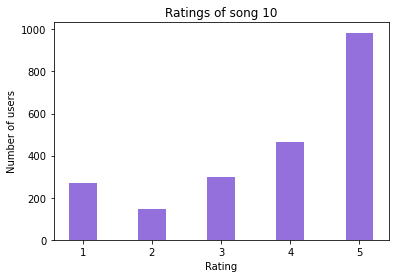

In [21]:
plt.bar(range(1,6),song_list, color ='mediumpurple',width = 0.4)
plt.xlabel("Rating")
plt.ylabel("Number of users")
plt.title("Ratings of song %d"%(song))
plt.show()

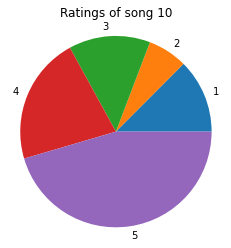

In [27]:
plt.pie(song_list,labels=[str(i) for i in range(1,6)],radius=1.1)
plt.title("Ratings of song %d"%(song))
plt.show()

## 4.3 Song overall rating

In [28]:
avg_rating = 0
for i in range(5):
    avg_rating += song_list[i]*(i+1)
avg_rating = avg_rating/sum(song_list)
print("Song overall rating: ",avg_rating)

Song overall rating:  3.807390300230947


## 4.4 Highest rated songs

In [32]:
rating_sum_list = [0]*song_df.shape[0]
rating_count_list = [0]*song_df.shape[0]

for file_num in tqdm(range(10),desc="Loading song ratings..."):
    with open("Dataset/train_%d.txt"%(file_num),"r") as f:
        while True:
            line = f.readline()
            if not line:
                break
            rating_sum_list[int(line.split()[1])]+=int(line.split()[2])
            rating_count_list[int(line.split()[1])]+=1

Loading song ratings...: 100%|████████████████████████████████████████████████████████| 10/10 [31:45<00:00, 190.57s/it]


In [67]:
rating_avgs = [i / j for i, j in zip(rating_sum_list, rating_count_list)]
for i in range(song_df.shape[0]):
    rating_avgs[i] = [i,rating_avgs[i]]
rating_avgs.sort(key=lambda x: x[1],reverse=True)

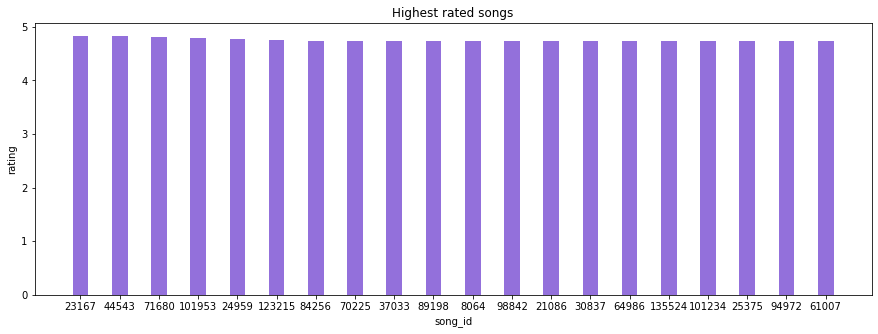

In [68]:
best_songs = [str(i[0]) for i in rating_avgs[:20]]
best_song_ratings = [i[1] for i in rating_avgs[:20]]
fig = plt.figure(figsize = (15, 5))
plt.bar(best_songs,best_song_ratings, color ='mediumpurple',width = 0.4)
plt.xlabel("song_id")
plt.ylabel("rating")
plt.title("Highest rated songs")
plt.show()

## 4.5 Lowest rated songs

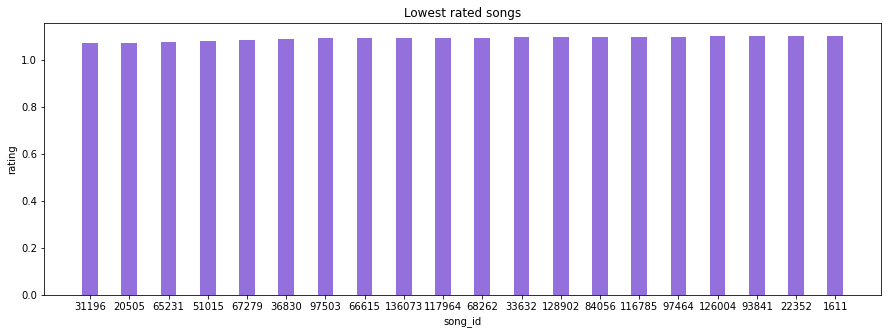

In [69]:
rating_avgs.sort(key=lambda x: x[1])
worst_songs = [str(i[0]) for i in rating_avgs[:20]]
worst_song_ratings = [i[1] for i in rating_avgs[:20]]
fig = plt.figure(figsize = (15, 5))
plt.bar(worst_songs,worst_song_ratings, color ='mediumpurple',width = 0.4)
plt.xlabel("song_id")
plt.ylabel("rating")
plt.title("Lowest rated songs")
plt.show()

## 5. Metrics - theoretical presentation
Before getting into details about the models which we use for this project, we considered appropriate to first present the metrics that we need to evaluate the different implementations:

## 5.1 MAE
MAE stands for Mean Absolute Error and its formula is:

$$MAE = \frac{1}{\left|\hat{R}\right|}\cdot\sum_{\hat{r}_{ui}\in\hat{R}}\left|r_{ui}-\hat{r}_{ui}\right|$$

## 5.2 MSE 
MSE stands for Mean Squared Error and its formula is:

$$MSE = \frac{1}{\left|\hat{R}\right|}\cdot\sum_{\hat{r}_{ui}\in\hat{R}}{(r_{ui}-\hat{r}_{ui})}^2$$

## 5.3 RMSE

RMSE stands for Root Mean Squared Error and its formula is:

$$RMSE = \sqrt{\frac{1}{\left|\hat{R}\right|}\cdot\sum_{\hat{r}_{ui}\in\hat{R}}{(r_{ui}-\hat{r}_{ui})}^2}$$

## 5.4 FCP
FCP stands for Fraction of Concordant Pairs. It finds all possible pairs of items rated by a specific user and classifies them as concordant or discordant. For a pair (i, j), if the user rated i higher than j and the model predicted a rating for i higher than the predicted rating for j, then the pair is concordant. Otherwise, it is discordant. After classifying the pairs, FCP calculates the percentage of pairs that are concordant.


## 5.5 Precision
To provide the formula for this metric, we first need to define two terms:
* Recommended items are the items which correspond to the top k rating predictions of the model.
* An item is considered relevant if its true rating is greater than a given threshold.

Precision calculates the proportion of recommended items that are also relevant:

$$Precision_{k} = \frac{\left|\text{Recommended and relevant items}\right|}{\left|\text{Recommended items}\right|}$$

## 5.6 Recall
The concept of recall is similar to the precision metric:

$$Recall_{k} = \frac{\left|\text{Recommended and relevant items}\right|}{\left|\text{Relevant items}\right|}$$

In [2]:
def precision_recall_at_k(predictions, k=80, threshold=3.5):
    
    # Mapping the predictions to each user
    user_est_true = defaultdict(list)
    for uid, _, true_r, est, _ in predictions:
        user_est_true[uid].append((est, true_r))

    precisions = dict()
    recalls = dict()
    for uid, user_ratings in user_est_true.items():
        # Sort estimated ratings
        user_ratings.sort(key=lambda x: x[0], reverse=True)

        # Number of relevant items
        n_rel = sum((true_r >= threshold) for (_, true_r) in user_ratings)

        # Number of recommended items in top k
        n_rec_k = sum((est >= threshold) for (est, _) in user_ratings[:k])

        # Number of relevant and recommended items in top k
        n_rel_and_rec_k = sum(((true_r >= threshold) and (est >= threshold))
                              for (est, true_r) in user_ratings[:k])

        precisions[uid] = n_rel_and_rec_k / n_rec_k if n_rec_k != 0 else 1
        recalls[uid] = n_rel_and_rec_k / n_rel if n_rel != 0 else 1

    return precisions, recalls

## 6. Types of recommender systems - theoretical presentation

There are two main techniques for recommendation engines, namely content-based filtering and collaborative filtering. The others are either extensions or hybrid recommender systems.

## 6.1 Content-Based Filtering
Content-based filtering uses item features to recommend other items similar to what the user likes.

Its main advantages are the following:
* No information about the user is needed, only his interests are required.
* The models are easy to scale.
* It does not have a "cold-start problem" in cases where the popularity of an item is still unknown.

On the other hand, content-based filtering has some limitations:
* The quality of the models depends on hand-engineered features of the items, so good domain knowledge is required.
* It cannot recommend the users something outside their range of interests.

## 6.2 Collaborative Filtering
Collaborative filtering depends on finding similar users to a target user to make personalized recommendations. It works solely with past user-item interactions.

Some of the reasons to prefer this kind of recommender systems are listed below:
* No domain knowledge is necessary.
* It can help users discover new interests.
* Only user-item ratings are required - no item features.  

The main disadvantages of collaborative filtering are the following:
* It faces a "cold-start problem", as it cannot handle "fresh items".
* It cannot easily exploit side features to improve the quality of a model.

## 7. Surprise models

At this point we are ready to explore the different models which the surprise library implements. To begin with, we need to select a partition of our dataset for training and testing, as the entire dataset is large (about 10 GB) and we cannot handle it easily with an average computer.

In [3]:
class GetData:
    def __init__(self,train_file_path,test_file_path,number_of_users,number_of_items) -> None:
        self.train_file = open(train_file_path,"r")
        self.test_file = open(test_file_path,"r")
        self.number_of_users = number_of_users
        self.num_of_items = number_of_items
        self.__is_empty = False
        try:
            os.mkdir("pipeline")
        except:
            pass
    def is_empty(self):
        return self.__is_empty
    def __init_pipelines(self):
        self.train_pipe = open("pipeline/train.txt","w")
        self.test_pipe = open("pipeline/test.txt","w")
    
    def get_raw_data(self):
        self.__init_pipelines()
        num_of_users = -1
        prev = ""
        while True:
            train_line = self.train_file.readline()
            if train_line == "":
                self.__is_empty = True
                break
            train_line_splitted = train_line.split("\t")
            user = train_line_splitted[0]
            if prev != user:
                prev = user
                num_of_users+=1
                if num_of_users  == self.number_of_users:
                    break
            self.train_pipe.write(train_line)
        self.train_pipe.close()
        num_of_users = -1
        prev = ""
        while True:
            test_line = self.test_file.readline()
            test_line_splitted = test_line.split("\t")
            user = test_line_splitted[0]
            if prev != user:
                prev = user
                num_of_users+=1
                if num_of_users  == self.number_of_users:
                    break
            self.test_pipe.write(test_line)
        self.test_pipe.close()

    def get_top_n_occ(self):
        train = pd.read_csv("pipeline/train.txt",delimiter="\t",engine="python",header=None)
        train.columns = ["user_id","item_id","rating"]
        songs_counter = Counter(train.item_id)
        self.songs_counter_sorted = sorted(songs_counter.items(), key=lambda x:x[1],reverse=True)[:self.num_of_items]

    def create_filtered_dataset(self):
        self.get_raw_data()
        self.get_top_n_occ()

        encoder = LabelEncoder()
        
        ids = [item[0] for item in self.songs_counter_sorted]

        encoder.fit(np.array(ids))
        pickle.dump(encoder,open('ids_label_encoder.pkl', 'wb'))


        train = pd.read_csv("pipeline/train.txt",delimiter="\t",engine="python",header=None)
        train.columns = ["user_id","item_id","rating"]
        train = train[train["item_id"].isin(ids)]
        train["item_id"] = encoder.transform(train["item_id"].to_numpy())

        test = pd.read_csv("pipeline/test.txt",delimiter="\t",engine="python",header=None)
        test.columns = ["user_id","item_id","rating"]
        test = test[test["item_id"].isin(ids)]
        test["item_id"] = encoder.transform(test["item_id"].to_numpy())

        train.to_csv('pipeline/train.txt', header=None, index=None, sep='\t', mode='w')
        test.to_csv('pipeline/test.txt', header=None, index=None, sep='\t', mode='w')

In [5]:
train_file_path = "Dataset/train_0.txt"
test_file_path = "Dataset/test_0.txt"

MAX_USERS = int(input("Select max numbers of users: "))
MAX_SONGS = int(input("Select max numbers of songs: "))
user = int(input("Select a user to calculate recommendations(0-%s):"%str(MAX_USERS-1)))
recommendation_num = int(input("Select number of recommendations: "))

print("\nCollecting train and test data...")
p = GetData(train_file_path,test_file_path,MAX_USERS,MAX_SONGS)
p.create_filtered_dataset()
print("Test and train data collected!")

Select max numbers of users: 10000
Select max numbers of songs: 10000
Select a user to calculate recommendations(0-9999):34
Select number of recommendations: 10

Test and train data collected!


In [4]:
train_data_path = "pipeline/train.txt"
test_data_path = "pipeline/test.txt"

print('Loading train data..\n')
reader = Reader(line_format='user item rating', sep='\t',rating_scale=(1, 5))
data = Dataset.load_from_file(train_data_path,reader=reader)
data = data.build_full_trainset()

print('Loading test data..\n')
test_data = Dataset.load_from_file(test_data_path,reader=reader)
test_data = test_data.build_full_trainset()
test_data = test_data.build_testset()

Loading train data..

Loading test data..



In [8]:
training_times_list = [0]*11
RMSE_list = [0]*11
MSE_list = [0]*11
MAE_list = [0]*11
FCP_list = [0]*11
precision_list = [0]*11
recall_list = [0]*11

## 7.1 Basic algorithms


## 7.1.1 Normal predictor

* This algorithm predicts a random rating $\hat{r_{ui}}$ based on the distribution of the training set, which is assumed to be normal.
* The parameters $\hat{\mu}$ and $\hat{\sigma}$ of the normal distribution $N(\hat{\mu},\hat{\sigma}^2)$ are estimated from the training data using Maximum Likelihood Estimation:

$$\hat{\mu} = \frac{1}{\left|R_{train}\right|}\cdot \sum_{r_{ui} \in R_{train}} r_{ui}$$

$$\hat{\sigma} = \sqrt{ \sum_{r_{ui} \in R_{train}} \frac{{(r_{ui} - \hat{\mu})}^2}{\left|R_{train}\right|}}$$

where $r_{ui}$ is the true rating of the user *u* for the item *i* and $R_{train}$ is the training set. 

In [11]:
#Training the model
model = surprise.prediction_algorithms.random_pred.NormalPredictor()
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[0] = toc-tic
print("Training time: %fs"%(training_times_list[0]))

Training time: 0.386772s


In [12]:
#Making predictions on the test set
preds = model.test(test_data)
for pred in preds:
    print(pred)

user: 0          item: 283        r_ui = 5.00   est = 2.48   {'was_impossible': False}
user: 0          item: 3311       r_ui = 5.00   est = 1.19   {'was_impossible': False}
user: 0          item: 4996       r_ui = 3.00   est = 5.00   {'was_impossible': False}
user: 1          item: 2271       r_ui = 3.00   est = 1.00   {'was_impossible': False}
user: 1          item: 4023       r_ui = 3.00   est = 3.57   {'was_impossible': False}
user: 1          item: 4480       r_ui = 3.00   est = 3.43   {'was_impossible': False}
user: 2          item: 3263       r_ui = 2.00   est = 2.69   {'was_impossible': False}
user: 2          item: 4644       r_ui = 3.00   est = 5.00   {'was_impossible': False}
user: 2          item: 4921       r_ui = 2.00   est = 2.98   {'was_impossible': False}
user: 3          item: 68         r_ui = 1.00   est = 3.81   {'was_impossible': False}
user: 3          item: 740        r_ui = 3.00   est = 3.25   {'was_impossible': False}
user: 3          item: 1853       r_ui = 5.

user: 1266       item: 2691       r_ui = 5.00   est = 4.29   {'was_impossible': False}
user: 1266       item: 3354       r_ui = 5.00   est = 4.07   {'was_impossible': False}
user: 1267       item: 540        r_ui = 5.00   est = 2.60   {'was_impossible': False}
user: 1267       item: 940        r_ui = 5.00   est = 5.00   {'was_impossible': False}
user: 1267       item: 1015       r_ui = 1.00   est = 5.00   {'was_impossible': False}
user: 1267       item: 1018       r_ui = 1.00   est = 2.36   {'was_impossible': False}
user: 1267       item: 3342       r_ui = 5.00   est = 3.17   {'was_impossible': False}
user: 1267       item: 3886       r_ui = 3.00   est = 3.43   {'was_impossible': False}
user: 1267       item: 4247       r_ui = 4.00   est = 1.98   {'was_impossible': False}
user: 1268       item: 116        r_ui = 5.00   est = 4.58   {'was_impossible': False}
user: 1268       item: 912        r_ui = 5.00   est = 4.18   {'was_impossible': False}
user: 1268       item: 1615       r_ui = 2.

user: 2504       item: 3850       r_ui = 1.00   est = 2.25   {'was_impossible': False}
user: 2505       item: 511        r_ui = 4.00   est = 2.56   {'was_impossible': False}
user: 2505       item: 722        r_ui = 4.00   est = 2.44   {'was_impossible': False}
user: 2505       item: 762        r_ui = 1.00   est = 3.89   {'was_impossible': False}
user: 2505       item: 1324       r_ui = 4.00   est = 2.23   {'was_impossible': False}
user: 2505       item: 3404       r_ui = 5.00   est = 2.18   {'was_impossible': False}
user: 2505       item: 3700       r_ui = 4.00   est = 3.80   {'was_impossible': False}
user: 2505       item: 3760       r_ui = 4.00   est = 2.29   {'was_impossible': False}
user: 2505       item: 4276       r_ui = 1.00   est = 4.29   {'was_impossible': False}
user: 2505       item: 4887       r_ui = 4.00   est = 1.48   {'was_impossible': False}
user: 2506       item: 1768       r_ui = 5.00   est = 4.42   {'was_impossible': False}
user: 2506       item: 3166       r_ui = 1.

user: 3947       item: 1387       r_ui = 3.00   est = 1.69   {'was_impossible': False}
user: 3947       item: 1747       r_ui = 1.00   est = 3.11   {'was_impossible': False}
user: 3947       item: 2516       r_ui = 5.00   est = 1.43   {'was_impossible': False}
user: 3948       item: 16         r_ui = 4.00   est = 3.64   {'was_impossible': False}
user: 3948       item: 2501       r_ui = 1.00   est = 3.29   {'was_impossible': False}
user: 3948       item: 2616       r_ui = 1.00   est = 4.79   {'was_impossible': False}
user: 3948       item: 3629       r_ui = 4.00   est = 3.49   {'was_impossible': False}
user: 3948       item: 3758       r_ui = 2.00   est = 4.10   {'was_impossible': False}
user: 3948       item: 3879       r_ui = 2.00   est = 1.45   {'was_impossible': False}
user: 3949       item: 257        r_ui = 4.00   est = 3.98   {'was_impossible': False}
user: 3950       item: 9          r_ui = 1.00   est = 2.85   {'was_impossible': False}
user: 3950       item: 531        r_ui = 1.

In [13]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[0] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[0] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[0] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[0] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[0] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[0] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[0]))
print("MSE: %.4f"%(MSE_list[0]))
print("MAE: %.4f"%(MAE_list[0]))
print("FCP: %.4f"%(FCP_list[0]))
print("Precision: %.4f"%(precision_list[0]))
print("Recall: %.4f"%(recall_list[0]))


********** MODEL PERFORMANCE **********
RMSE: 1.9991
MSE: 3.9964
MAE: 1.6190
FCP: 0.4862
Precision: 0.6221
Recall: 0.5257


## 7.1.2 Baseline estimate

This algorithm predicts the baseline estimate for a given user *u* and item *i*.

$$\hat{r_{ui}} = b_{ui} = \mu + b_u + b_i$$

where $\mu$ is the mean of all ratings, $b_u$ is a bias corresponding to user *u* and $b_i$ is a bias corresponding to item *i*.

If the user is unknown, then the bias $b_u$ is assumed to be zero. The same applies for the item and the bias $b_i$.

In [14]:
#Training the model
model = surprise.prediction_algorithms.baseline_only.BaselineOnly(verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[1] = toc-tic
print("Training time: %fs"%(training_times_list[1]))

Training time: 0.786889s


In [16]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[1] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[1] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[1] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[1] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[1] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[1] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[1]))
print("MSE: %.4f"%(MSE_list[1]))
print("MAE: %.4f"%(MAE_list[1]))
print("FCP: %.4f"%(FCP_list[1]))
print("Precision: %.4f"%(precision_list[1]))
print("Recall: %.4f"%(recall_list[1]))


********** MODEL PERFORMANCE **********
RMSE: 1.2552
MSE: 1.5755
MAE: 1.0344
FCP: 0.5613
Precision: 0.8363
Recall: 0.6449


## 7.2 k-NN algorithms

## 7.2.1 Basic k-NN algorithm

The k-NN algorithm has two forms:
* User-based k-NN: It creates a set $N_i^k(u)$ with the nearest neighbors of the user *u* and makes a prediction using the formula:

$$\hat{r_{ui}} = \frac{\sum_{v \in N_i^k(u)}sim(u,v)\cdot r_{vi}}{\sum_{v \in N_i^k(u)}sim(u,v)}$$

* Item-based k-NN: It creates a set $N_u^k(i)$ with the nearest neighbors of the item *i* and makes a prediction using the formula:

$$\hat{r_{ui}} = \frac{\sum_{j \in N_u^k(i)}sim(i,j)\cdot r_{uj}}{\sum_{j \in N_u^k(i)}sim(i,j)}$$


In [17]:
#Training the model
model = surprise.prediction_algorithms.knns.KNNBasic(k=50,sim_options={"name":"MSD","user_based":True},verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[2] = toc-tic
print("Training time: %fs"%(training_times_list[2]))

Training time: 5.438777s


In [18]:
#Making predictions on the test set
preds = model.test(test_data)
for pred in preds:
    print(pred)

user: 0          item: 283        r_ui = 5.00   est = 4.06   {'actual_k': 50, 'was_impossible': False}
user: 0          item: 3311       r_ui = 5.00   est = 3.66   {'actual_k': 50, 'was_impossible': False}
user: 0          item: 4996       r_ui = 3.00   est = 4.43   {'actual_k': 50, 'was_impossible': False}
user: 1          item: 2271       r_ui = 3.00   est = 3.51   {'actual_k': 50, 'was_impossible': False}
user: 1          item: 4023       r_ui = 3.00   est = 4.16   {'actual_k': 50, 'was_impossible': False}
user: 1          item: 4480       r_ui = 3.00   est = 2.95   {'actual_k': 50, 'was_impossible': False}
user: 2          item: 3263       r_ui = 2.00   est = 3.20   {'actual_k': 50, 'was_impossible': False}
user: 2          item: 4644       r_ui = 3.00   est = 3.24   {'actual_k': 50, 'was_impossible': False}
user: 2          item: 4921       r_ui = 2.00   est = 2.51   {'actual_k': 50, 'was_impossible': False}
user: 3          item: 68         r_ui = 1.00   est = 3.07   {'actual_k':

user: 1453       item: 3675       r_ui = 5.00   est = 4.00   {'actual_k': 50, 'was_impossible': False}
user: 1453       item: 4028       r_ui = 5.00   est = 3.64   {'actual_k': 50, 'was_impossible': False}
user: 1454       item: 559        r_ui = 4.00   est = 4.16   {'actual_k': 50, 'was_impossible': False}
user: 1454       item: 1200       r_ui = 5.00   est = 4.50   {'actual_k': 50, 'was_impossible': False}
user: 1454       item: 2276       r_ui = 4.00   est = 4.05   {'actual_k': 50, 'was_impossible': False}
user: 1454       item: 2725       r_ui = 5.00   est = 4.18   {'actual_k': 50, 'was_impossible': False}
user: 1454       item: 3513       r_ui = 4.00   est = 3.93   {'actual_k': 50, 'was_impossible': False}
user: 1454       item: 3818       r_ui = 4.00   est = 4.30   {'actual_k': 50, 'was_impossible': False}
user: 1454       item: 3909       r_ui = 5.00   est = 3.46   {'actual_k': 50, 'was_impossible': False}
user: 1454       item: 4633       r_ui = 5.00   est = 4.39   {'actual_k':

user: 2931       item: 640        r_ui = 5.00   est = 4.28   {'actual_k': 50, 'was_impossible': False}
user: 2931       item: 756        r_ui = 5.00   est = 4.18   {'actual_k': 50, 'was_impossible': False}
user: 2931       item: 1889       r_ui = 5.00   est = 4.10   {'actual_k': 50, 'was_impossible': False}
user: 2931       item: 2264       r_ui = 5.00   est = 4.44   {'actual_k': 50, 'was_impossible': False}
user: 2931       item: 3086       r_ui = 5.00   est = 4.50   {'actual_k': 50, 'was_impossible': False}
user: 2931       item: 3374       r_ui = 5.00   est = 3.71   {'actual_k': 50, 'was_impossible': False}
user: 2931       item: 3379       r_ui = 5.00   est = 4.16   {'actual_k': 50, 'was_impossible': False}
user: 2933       item: 1605       r_ui = 5.00   est = 4.43   {'actual_k': 50, 'was_impossible': False}
user: 2933       item: 4403       r_ui = 5.00   est = 4.40   {'actual_k': 50, 'was_impossible': False}
user: 2934       item: 896        r_ui = 3.00   est = 3.72   {'actual_k':

user: 4382       item: 807        r_ui = 5.00   est = 4.50   {'actual_k': 50, 'was_impossible': False}
user: 4382       item: 3785       r_ui = 5.00   est = 4.02   {'actual_k': 50, 'was_impossible': False}
user: 4383       item: 2019       r_ui = 5.00   est = 4.47   {'actual_k': 50, 'was_impossible': False}
user: 4384       item: 868        r_ui = 5.00   est = 4.64   {'actual_k': 50, 'was_impossible': False}
user: 4384       item: 1834       r_ui = 5.00   est = 4.32   {'actual_k': 50, 'was_impossible': False}
user: 4384       item: 2260       r_ui = 5.00   est = 4.41   {'actual_k': 50, 'was_impossible': False}
user: 4385       item: 857        r_ui = 1.00   est = 3.33   {'actual_k': 50, 'was_impossible': False}
user: 4385       item: 1407       r_ui = 3.00   est = 3.75   {'actual_k': 50, 'was_impossible': False}
user: 4385       item: 1461       r_ui = 5.00   est = 3.52   {'actual_k': 50, 'was_impossible': False}
user: 4385       item: 2882       r_ui = 5.00   est = 3.55   {'actual_k':

In [19]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[2] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[2] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[2] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[2] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[2] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[2] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[2]))
print("MSE: %.4f"%(MSE_list[2]))
print("MAE: %.4f"%(MAE_list[2]))
print("FCP: %.4f"%(FCP_list[2]))
print("Precision: %.4f"%(precision_list[2]))
print("Recall: %.4f"%(recall_list[2]))


********** MODEL PERFORMANCE **********
RMSE: 1.2661
MSE: 1.6031
MAE: 1.0490
FCP: 0.5876
Precision: 0.7668
Recall: 0.7512


## 7.2.2 k-NN with means

Compared to the basic algorithm, this method takes into account the mean of each user/item:

* User-based k-NN: 

$$\hat{r_{ui}} = \mu_{u} + \frac{\sum_{v \in N_i^k(u)}sim(u,v)\cdot (r_{vi} - \mu_{v})}{\sum_{v \in N_i^k(u)}sim(u,v)}$$

* Item-based k-NN:

$$\hat{r_{ui}} = \mu_{i}  + \frac{\sum_{j \in N_u^k(i)}sim(i,j)\cdot (r_{uj} - \mu_{j})}{\sum_{j \in N_u^k(i)}sim(i,j)}$$

In [20]:
#Training the model
model = surprise.prediction_algorithms.knns.KNNWithMeans(verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[3] = toc-tic
print("Training time: %fs"%(training_times_list[3]))

Training time: 5.376683s


In [22]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[3] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[3] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[3] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[3] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[3] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[3] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[3]))
print("MSE: %.4f"%(MSE_list[3]))
print("MAE: %.4f"%(MAE_list[3]))
print("FCP: %.4f"%(FCP_list[3]))
print("Precision: %.4f"%(precision_list[3]))
print("Recall: %.4f"%(recall_list[3]))


********** MODEL PERFORMANCE **********
RMSE: 1.2295
MSE: 1.5116
MAE: 0.9473
FCP: 0.5725
Precision: 0.8366
Recall: 0.6809


## 7.2.3 k-NN with z-score

This algorithm takes into consideration the z-score normalization of each user:

* User-based k-NN: 

$$\hat{r_{ui}} = \mu_{u} + \sigma_{u}\cdot\frac{\sum_{v \in N_i^k(u)}sim(u,v)\cdot \frac{r_{vi} - \mu_{v}}{\sigma_{v}}}{\sum_{v \in N_i^k(u)}sim(u,v)}$$

* Item-based k-NN:

$$\hat{r_{ui}} = \mu_{i}  + \sigma_{i}\cdot\frac{\sum_{j \in N_u^k(i)}sim(i,j)\cdot\frac{r_{uj} - \mu_{j}}{\sigma_{j}}}{\sum_{j \in N_u^k(i)}sim(i,j)}$$

In [23]:
#Training the model
model = surprise.prediction_algorithms.knns.KNNWithZScore(verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[4] = toc-tic
print("Training time: %fs"%(training_times_list[4]))

Training time: 5.492656s


In [25]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[4] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[4] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[4] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[4] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[4] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[4] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[4]))
print("MSE: %.4f"%(MSE_list[4]))
print("MAE: %.4f"%(MAE_list[4]))
print("FCP: %.4f"%(FCP_list[4]))
print("Precision: %.4f"%(precision_list[4]))
print("Recall: %.4f"%(recall_list[4]))


********** MODEL PERFORMANCE **********
RMSE: 1.2271
MSE: 1.5058
MAE: 0.9421
FCP: 0.5713
Precision: 0.8334
Recall: 0.6836


## 7.2.4 k-NN with baseline rating

Compared to the basic algorithm, this method takes into account a baseline rating:

* User-based k-NN: 

$$\hat{r_{ui}} = b_{ui} + \frac{\sum_{v \in N_i^k(u)}sim(u,v)\cdot (r_{vi} - b_{vi})}{\sum_{v \in N_i^k(u)}sim(u,v)}$$

* Item-based k-NN:

$$\hat{r_{ui}} = b_{ui} + \frac{\sum_{j \in N_u^k(i)}sim(i,j)\cdot (r_{uj} - b_{uj})}{\sum_{j \in N_u^k(i)}sim(i,j)}$$

In [26]:
#Training the model
model = surprise.prediction_algorithms.knns.KNNBaseline(verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[5] = toc-tic
print("Training time: %fs"%(training_times_list[5]))

Training time: 6.027402s


In [28]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[5] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[5] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[5] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[5] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[5] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[5] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[5]))
print("MSE: %.4f"%(MSE_list[5]))
print("MAE: %.4f"%(MAE_list[5]))
print("FCP: %.4f"%(FCP_list[5]))
print("Precision: %.4f"%(precision_list[5]))
print("Recall: %.4f"%(recall_list[5]))


********** MODEL PERFORMANCE **********
RMSE: 1.2307
MSE: 1.5146
MAE: 0.9848
FCP: 0.5771
Precision: 0.8214
Recall: 0.6944


## 7.3 Matrix factorization

## 7.3.1 Matrix factorization with SVD

This algorithm expresses the large user-item matrices - which we use for the purposes of recommender system problems - as the product of two smaller matrices P, Q and ,therefore, saves a lot of storage. To efficiently calculate the elements of these two matrices, we initialize them randomly first and then try to minimize a regularized squared error function which expresses the difference between the product of the matrices P, Q and the initial matrix:

$$\sum_{r_{ui} \in R_{train}} {(r_{ui} - \hat{r}_{ui})}^2 + \lambda(b_i^2+b_u^2 + {\lVert q_i\rVert}^2 + {\lVert p_u \rVert}^2 )$$

where $q_i$ is the row of matrix Q corresponding to the item *i*, $p_u$ is the row of matrix P corresponding  to the user *u* and $\lambda$ is the regularization term.

To achieve this minimization many different algorithms can be deployed, like stochastic gradient descent.

The two matrices are then used to make predictions with the help of the formula:

$$\hat{r_{ui}} = \mu + b_{u} + b_{i} + q_{i}^T\cdot p_{u}$$

In [29]:
#Training the model
model = surprise.prediction_algorithms.matrix_factorization.SVD(verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[6] = toc-tic
print("Training time: %fs"%(training_times_list[6]))

Training time: 3.775011s


In [30]:
#Making predictions on the test set
preds = model.test(test_data)
for pred in preds:
    print(pred)

user: 0          item: 283        r_ui = 5.00   est = 4.00   {'was_impossible': False}
user: 0          item: 3311       r_ui = 5.00   est = 3.91   {'was_impossible': False}
user: 0          item: 4996       r_ui = 3.00   est = 4.38   {'was_impossible': False}
user: 1          item: 2271       r_ui = 3.00   est = 3.06   {'was_impossible': False}
user: 1          item: 4023       r_ui = 3.00   est = 3.23   {'was_impossible': False}
user: 1          item: 4480       r_ui = 3.00   est = 2.77   {'was_impossible': False}
user: 2          item: 3263       r_ui = 2.00   est = 3.00   {'was_impossible': False}
user: 2          item: 4644       r_ui = 3.00   est = 2.81   {'was_impossible': False}
user: 2          item: 4921       r_ui = 2.00   est = 2.77   {'was_impossible': False}
user: 3          item: 68         r_ui = 1.00   est = 3.14   {'was_impossible': False}
user: 3          item: 740        r_ui = 3.00   est = 3.44   {'was_impossible': False}
user: 3          item: 1853       r_ui = 5.

user: 805        item: 152        r_ui = 5.00   est = 4.90   {'was_impossible': False}
user: 805        item: 755        r_ui = 3.00   est = 3.82   {'was_impossible': False}
user: 805        item: 1614       r_ui = 5.00   est = 4.14   {'was_impossible': False}
user: 805        item: 1671       r_ui = 4.00   est = 3.36   {'was_impossible': False}
user: 805        item: 2471       r_ui = 4.00   est = 4.88   {'was_impossible': False}
user: 806        item: 9          r_ui = 3.00   est = 3.32   {'was_impossible': False}
user: 806        item: 443        r_ui = 2.00   est = 2.77   {'was_impossible': False}
user: 806        item: 2285       r_ui = 1.00   est = 3.09   {'was_impossible': False}
user: 806        item: 3630       r_ui = 1.00   est = 3.53   {'was_impossible': False}
user: 806        item: 4679       r_ui = 5.00   est = 3.33   {'was_impossible': False}
user: 806        item: 4688       r_ui = 5.00   est = 3.19   {'was_impossible': False}
user: 806        item: 4833       r_ui = 4.

user: 1465       item: 2695       r_ui = 5.00   est = 4.74   {'was_impossible': False}
user: 1465       item: 2768       r_ui = 5.00   est = 5.00   {'was_impossible': False}
user: 1465       item: 3115       r_ui = 5.00   est = 4.88   {'was_impossible': False}
user: 1465       item: 4310       r_ui = 5.00   est = 4.37   {'was_impossible': False}
user: 1465       item: 4969       r_ui = 5.00   est = 4.58   {'was_impossible': False}
user: 1466       item: 2729       r_ui = 4.00   est = 3.62   {'was_impossible': False}
user: 1466       item: 4838       r_ui = 1.00   est = 2.93   {'was_impossible': False}
user: 1467       item: 1682       r_ui = 4.00   est = 3.64   {'was_impossible': False}
user: 1467       item: 2503       r_ui = 3.00   est = 2.90   {'was_impossible': False}
user: 1467       item: 3711       r_ui = 3.00   est = 3.71   {'was_impossible': False}
user: 1468       item: 1247       r_ui = 1.00   est = 1.93   {'was_impossible': False}
user: 1468       item: 1317       r_ui = 3.

user: 2163       item: 3530       r_ui = 3.00   est = 3.29   {'was_impossible': False}
user: 2163       item: 3645       r_ui = 4.00   est = 3.89   {'was_impossible': False}
user: 2163       item: 4500       r_ui = 4.00   est = 4.10   {'was_impossible': False}
user: 2164       item: 15         r_ui = 5.00   est = 4.15   {'was_impossible': False}
user: 2164       item: 87         r_ui = 4.00   est = 3.50   {'was_impossible': False}
user: 2164       item: 479        r_ui = 5.00   est = 3.76   {'was_impossible': False}
user: 2164       item: 519        r_ui = 4.00   est = 3.44   {'was_impossible': False}
user: 2164       item: 739        r_ui = 5.00   est = 3.80   {'was_impossible': False}
user: 2164       item: 1780       r_ui = 2.00   est = 3.80   {'was_impossible': False}
user: 2164       item: 1925       r_ui = 1.00   est = 3.55   {'was_impossible': False}
user: 2164       item: 3112       r_ui = 5.00   est = 3.76   {'was_impossible': False}
user: 2164       item: 3201       r_ui = 2.

user: 2848       item: 2402       r_ui = 1.00   est = 2.96   {'was_impossible': False}
user: 2848       item: 3998       r_ui = 1.00   est = 3.76   {'was_impossible': False}
user: 2848       item: 4357       r_ui = 5.00   est = 3.57   {'was_impossible': False}
user: 2849       item: 2690       r_ui = 5.00   est = 2.50   {'was_impossible': False}
user: 2849       item: 3597       r_ui = 2.00   est = 3.80   {'was_impossible': False}
user: 2850       item: 626        r_ui = 3.00   est = 3.08   {'was_impossible': False}
user: 2850       item: 959        r_ui = 5.00   est = 2.87   {'was_impossible': False}
user: 2850       item: 1115       r_ui = 3.00   est = 2.82   {'was_impossible': False}
user: 2850       item: 1780       r_ui = 3.00   est = 3.39   {'was_impossible': False}
user: 2850       item: 2160       r_ui = 3.00   est = 2.42   {'was_impossible': False}
user: 2850       item: 2598       r_ui = 3.00   est = 3.25   {'was_impossible': False}
user: 2850       item: 3115       r_ui = 3.

user: 3635       item: 670        r_ui = 5.00   est = 2.93   {'was_impossible': False}
user: 3635       item: 684        r_ui = 5.00   est = 5.00   {'was_impossible': False}
user: 3635       item: 1938       r_ui = 1.00   est = 2.87   {'was_impossible': False}
user: 3635       item: 2302       r_ui = 4.00   est = 3.45   {'was_impossible': False}
user: 3635       item: 2750       r_ui = 1.00   est = 2.99   {'was_impossible': False}
user: 3635       item: 3779       r_ui = 5.00   est = 3.61   {'was_impossible': False}
user: 3635       item: 4848       r_ui = 5.00   est = 4.46   {'was_impossible': False}
user: 3636       item: 1253       r_ui = 5.00   est = 4.35   {'was_impossible': False}
user: 3636       item: 4698       r_ui = 5.00   est = 5.00   {'was_impossible': False}
user: 3637       item: 443        r_ui = 3.00   est = 2.83   {'was_impossible': False}
user: 3637       item: 1387       r_ui = 4.00   est = 3.38   {'was_impossible': False}
user: 3637       item: 2675       r_ui = 2.

user: 4428       item: 2653       r_ui = 3.00   est = 3.33   {'was_impossible': False}
user: 4428       item: 2745       r_ui = 3.00   est = 3.32   {'was_impossible': False}
user: 4428       item: 3023       r_ui = 3.00   est = 3.19   {'was_impossible': False}
user: 4428       item: 3415       r_ui = 4.00   est = 3.26   {'was_impossible': False}
user: 4429       item: 32         r_ui = 5.00   est = 4.91   {'was_impossible': False}
user: 4429       item: 799        r_ui = 5.00   est = 5.00   {'was_impossible': False}
user: 4429       item: 1091       r_ui = 5.00   est = 5.00   {'was_impossible': False}
user: 4429       item: 1144       r_ui = 5.00   est = 4.98   {'was_impossible': False}
user: 4429       item: 1442       r_ui = 5.00   est = 4.60   {'was_impossible': False}
user: 4429       item: 2793       r_ui = 5.00   est = 4.64   {'was_impossible': False}
user: 4429       item: 4774       r_ui = 5.00   est = 5.00   {'was_impossible': False}
user: 4430       item: 940        r_ui = 5.

In [31]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[6] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[6] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[6] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[6] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[6] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[6] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[6]))
print("MSE: %.4f"%(MSE_list[6]))
print("MAE: %.4f"%(MAE_list[6]))
print("FCP: %.4f"%(FCP_list[6]))
print("Precision: %.4f"%(precision_list[6]))
print("Recall: %.4f"%(recall_list[6]))


********** MODEL PERFORMANCE **********
RMSE: 1.2131
MSE: 1.4716
MAE: 0.9543
FCP: 0.5934
Precision: 0.8148
Recall: 0.6906


## 7.3.2 Matrix factorization with SVD++

This algorithm is an extension of the previous one and takes into account implicit ratings. Implicit ratings express the fact that the user *u* rated the item *i* without taking into consideration the corresponding rating value.

The formula used for predictions in this case is the following:

$$\hat{r_{ui}} = \mu + b_{u} + b_{i} + q_{i}^T\cdot (p_{u}+\left|I_u\right|^{-\frac{1}{2}}\sum_{j \in I_u} y_j)$$
where the factors $y_j$ describe the implicit ratings and $I_u$ is the set of all items rated by the user *u*.

In [32]:
#Training the model
model = surprise.prediction_algorithms.matrix_factorization.SVDpp(verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[7] = toc-tic
print("Training time: %fs"%(training_times_list[7]))

Training time: 405.578240s


In [34]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[7] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[7] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[7] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[7] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[7] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[7] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[7]))
print("MSE: %.4f"%(MSE_list[7]))
print("MAE: %.4f"%(MAE_list[7]))
print("FCP: %.4f"%(FCP_list[7]))
print("Precision: %.4f"%(precision_list[7]))
print("Recall: %.4f"%(recall_list[7]))


********** MODEL PERFORMANCE **********
RMSE: 1.1716
MSE: 1.3727
MAE: 0.9046
FCP: 0.6159
Precision: 0.8231
Recall: 0.7075


##  7.3.3 Non-negative Matrix Factorization

The main difference between matrix factorization with SVD and Non-negative Matrix Factorization is the fact that the latter uses entirely non-negative factors - hence the name. In addition, in this case the mean value of the ratings and the biases of the users and the items are not taken into account when making predictions:

$$\hat{r_{ui}} = q_{i}^T\cdot p_{u}$$

In [35]:
#Training the model
model = surprise.prediction_algorithms.matrix_factorization.NMF(verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[8] = toc-tic
print("Training time: %fs"%(training_times_list[8]))

Training time: 6.129766s


In [37]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[8] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[8] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[8] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[8] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[8] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[8] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[8]))
print("MSE: %.4f"%(MSE_list[8]))
print("MAE: %.4f"%(MAE_list[8]))
print("FCP: %.4f"%(FCP_list[8]))
print("Precision: %.4f"%(precision_list[8]))
print("Recall: %.4f"%(recall_list[8]))


********** MODEL PERFORMANCE **********
RMSE: 1.2591
MSE: 1.5853
MAE: 0.9775
FCP: 0.5547
Precision: 0.8192
Recall: 0.6694


## 7.4 Slope One algorithm

The Slope One algorithm is based on the idea of "popularity differentials". More specifically, to predict the rating that the user *u* will give to the item *i*, it spots all the items that the user *u* has rated and that have at least one rating by another user. Iteratively it selects one of these items *j*, finds the users who have rated both *i* and *j* and calculates the difference between each user 's rating of *i* and rating of *j*. To complete each step, the sum of all of the differences is computed and the result is divided by the number of users. After the computations for all items are done, the final result stems from the average of all the previously calculated results.

The formula used by the surprise library for this algorithm is the following:


$$\hat{r}_{ui} = \mu_{u} + \frac{1}{\left|R_i(u)\right|}\sum_{j \in R_i(u)} dev (i,j)$$

where $ R_i(u)$ is the set of items rated by *u*  that also have at least one common user with *i* and $dev (i,j)$ is the average difference between the ratings of the item *i* and those of the item *j*: 

$$dev(i,j)=\frac{1}{U_{ij}}\sum_{u \in U_{ij}} r_{ui} - r_{uj}$$

$U_{ij}$ is the set of all users that have rated both items *i* and *j*.

In [38]:
#Training the model
model = surprise.prediction_algorithms.slope_one.SlopeOne()
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[9] = toc-tic
print("Training time: %fs"%(training_times_list[9]))

Training time: 11.918626s


In [39]:
#Making predictions on the test set
preds = model.test(test_data)
for pred in preds:
    print(pred)

user: 0          item: 283        r_ui = 5.00   est = 4.30   {'was_impossible': False}
user: 0          item: 3311       r_ui = 5.00   est = 4.43   {'was_impossible': False}
user: 0          item: 4996       r_ui = 3.00   est = 4.82   {'was_impossible': False}
user: 1          item: 2271       r_ui = 3.00   est = 3.43   {'was_impossible': False}
user: 1          item: 4023       r_ui = 3.00   est = 3.76   {'was_impossible': False}
user: 1          item: 4480       r_ui = 3.00   est = 3.10   {'was_impossible': False}
user: 2          item: 3263       r_ui = 2.00   est = 3.11   {'was_impossible': False}
user: 2          item: 4644       r_ui = 3.00   est = 3.20   {'was_impossible': False}
user: 2          item: 4921       r_ui = 2.00   est = 2.52   {'was_impossible': False}
user: 3          item: 68         r_ui = 1.00   est = 3.37   {'was_impossible': False}
user: 3          item: 740        r_ui = 3.00   est = 3.00   {'was_impossible': False}
user: 3          item: 1853       r_ui = 5.

user: 1218       item: 2349       r_ui = 1.00   est = 3.36   {'was_impossible': False}
user: 1218       item: 3823       r_ui = 5.00   est = 3.56   {'was_impossible': False}
user: 1218       item: 4716       r_ui = 1.00   est = 3.33   {'was_impossible': False}
user: 1219       item: 601        r_ui = 5.00   est = 4.40   {'was_impossible': False}
user: 1219       item: 917        r_ui = 5.00   est = 4.23   {'was_impossible': False}
user: 1219       item: 2303       r_ui = 4.00   est = 4.17   {'was_impossible': False}
user: 1219       item: 2619       r_ui = 5.00   est = 3.64   {'was_impossible': False}
user: 1219       item: 3239       r_ui = 1.00   est = 3.58   {'was_impossible': False}
user: 1219       item: 4722       r_ui = 5.00   est = 4.46   {'was_impossible': False}
user: 1220       item: 533        r_ui = 5.00   est = 4.43   {'was_impossible': False}
user: 1220       item: 716        r_ui = 5.00   est = 4.32   {'was_impossible': False}
user: 1220       item: 1243       r_ui = 5.

user: 2755       item: 2902       r_ui = 2.00   est = 2.57   {'was_impossible': False}
user: 2755       item: 3290       r_ui = 1.00   est = 3.14   {'was_impossible': False}
user: 2755       item: 3679       r_ui = 5.00   est = 2.94   {'was_impossible': False}
user: 2756       item: 1352       r_ui = 5.00   est = 4.87   {'was_impossible': False}
user: 2756       item: 2447       r_ui = 5.00   est = 4.46   {'was_impossible': False}
user: 2756       item: 3284       r_ui = 2.00   est = 4.75   {'was_impossible': False}
user: 2757       item: 622        r_ui = 5.00   est = 4.10   {'was_impossible': False}
user: 2757       item: 1628       r_ui = 3.00   est = 4.31   {'was_impossible': False}
user: 2757       item: 2329       r_ui = 4.00   est = 4.30   {'was_impossible': False}
user: 2757       item: 2829       r_ui = 5.00   est = 4.15   {'was_impossible': False}
user: 2757       item: 4693       r_ui = 5.00   est = 4.07   {'was_impossible': False}
user: 2758       item: 83         r_ui = 1.

user: 4219       item: 2482       r_ui = 3.00   est = 3.94   {'was_impossible': False}
user: 4219       item: 2538       r_ui = 5.00   est = 4.42   {'was_impossible': False}
user: 4219       item: 2587       r_ui = 5.00   est = 4.23   {'was_impossible': False}
user: 4219       item: 4601       r_ui = 5.00   est = 4.29   {'was_impossible': False}
user: 4220       item: 3538       r_ui = 4.00   est = 2.87   {'was_impossible': False}
user: 4220       item: 4768       r_ui = 2.00   est = 3.22   {'was_impossible': False}
user: 4221       item: 556        r_ui = 2.00   est = 3.25   {'was_impossible': False}
user: 4221       item: 1542       r_ui = 2.00   est = 3.24   {'was_impossible': False}
user: 4221       item: 2627       r_ui = 3.00   est = 3.08   {'was_impossible': False}
user: 4221       item: 3342       r_ui = 4.00   est = 2.96   {'was_impossible': False}
user: 4221       item: 4271       r_ui = 4.00   est = 3.15   {'was_impossible': False}
user: 4221       item: 4813       r_ui = 2.

user: 4864       item: 4288       r_ui = 5.00   est = 3.90   {'was_impossible': False}
user: 4864       item: 4559       r_ui = 5.00   est = 3.70   {'was_impossible': False}
user: 4865       item: 178        r_ui = 5.00   est = 2.21   {'was_impossible': False}
user: 4865       item: 364        r_ui = 1.00   est = 2.56   {'was_impossible': False}
user: 4865       item: 1414       r_ui = 1.00   est = 1.63   {'was_impossible': False}
user: 4865       item: 2908       r_ui = 1.00   est = 2.10   {'was_impossible': False}
user: 4865       item: 2909       r_ui = 5.00   est = 2.33   {'was_impossible': False}
user: 4866       item: 625        r_ui = 2.00   est = 1.94   {'was_impossible': False}
user: 4866       item: 1137       r_ui = 3.00   est = 1.23   {'was_impossible': False}
user: 4866       item: 1814       r_ui = 1.00   est = 2.14   {'was_impossible': False}
user: 4866       item: 2571       r_ui = 2.00   est = 1.72   {'was_impossible': False}
user: 4866       item: 3626       r_ui = 2.

In [40]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[9] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[9] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[9] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[9] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[9] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[9] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[9]))
print("MSE: %.4f"%(MSE_list[9]))
print("MAE: %.4f"%(MAE_list[9]))
print("FCP: %.4f"%(FCP_list[9]))
print("Precision: %.4f"%(precision_list[9]))
print("Recall: %.4f"%(recall_list[9]))


********** MODEL PERFORMANCE **********
RMSE: 1.2369
MSE: 1.5298
MAE: 0.9665
FCP: 0.5654
Precision: 0.8334
Recall: 0.6653


## 7.5 Co-clustering algorithm

Given the user-item matrix, users and items are assigned some clusters $C_u$, $C_i$, and some co-clusters $C_{ui}$. In general, co-clusters find a subset of rows which exhibit similar behavior across a subset of columns.

The predictions are calculated as:

$$\hat{r}_{ui} = \bar{C_{ui}} + (\mu_u - \bar{C_u}) + (\mu_i - \bar{C_i})$$

where $-$ on the variables represents the mean value of the cluster/co-cluster.

In [41]:
#Training the model
model = surprise.prediction_algorithms.co_clustering.CoClustering(verbose=False)
tic = time.time()
model.fit(data)
toc = time.time()
training_times_list[10] = toc-tic
print("Training time: %fs"%(training_times_list[10]))

Training time: 6.911849s


In [43]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
precisions, recalls = precision_recall_at_k(preds)
RMSE_list[10] = surprise.accuracy.rmse(preds,verbose=False) 
MSE_list[10] = surprise.accuracy.mse(preds,verbose=False)
MAE_list[10] = surprise.accuracy.mae(preds,verbose=False)
FCP_list[10] = surprise.accuracy.fcp(preds,verbose=False)
precision_list[10] = sum(prec for prec in precisions.values()) / len(precisions)
recall_list[10] = sum(rec for rec in recalls.values()) / len(recalls)
print("RMSE: %.4f"%(RMSE_list[10]))
print("MSE: %.4f"%(MSE_list[10]))
print("MAE: %.4f"%(MAE_list[10]))
print("FCP: %.4f"%(FCP_list[10]))
print("Precision: %.4f"%(precision_list[10]))
print("Recall: %.4f"%(recall_list[10]))


********** MODEL PERFORMANCE **********
RMSE: 1.2479
MSE: 1.5573
MAE: 0.9595
FCP: 0.5584
Precision: 0.8268
Recall: 0.6687


## 7.6 Model comparison

In [44]:
perf_list = [[RMSE_list[i],MSE_list[i],MAE_list[i],FCP_list[i],precision_list[i],recall_list[i],training_times_list[i]] for i in range(11)]
performance_df = pd.DataFrame(perf_list, columns = ['RMSE','MSE', 'MAE','FCP','precision','recall','training_time'])
performance_df = performance_df.set_index(pd.Index(['Normal Predictor','Baseline Only', 'Basic k-NN','k-NN with Means',
                                                    'k-NN with z-score','k-NN Baseline','Matrix Factorization SVD',
                                                    'Matrix Factorization SVD++','Non-negative Matrix Factorization',
                                                   'Slope One', 'Co-clustering']))
performance_df

,RMSE,MSE,MAE,FCP,precision,recall,training_time
Normal Predictor,1.999094,3.996377,1.618990,0.486237,0.622055,0.525657,0.386772
Baseline Only,1.255197,1.575519,1.034377,0.561340,0.836285,0.644896,0.786889
Basic k-NN,1.266139,1.603107,1.049030,0.587582,0.766795,0.751161,5.438777
k-NN with Means,1.229456,1.511563,0.947255,0.572488,0.836605,0.680856,5.376683
k-NN with z-score,1.227109,1.505796,0.942067,0.571303,0.833447,0.683613,5.492656
k-NN Baseline,1.230701,1.514626,0.984781,0.577147,0.821388,0.694375,6.027402
Matrix Factorization SVD,1.213085,1.471575,0.954316,0.593443,0.814818,0.690587,3.775011
Matrix Factorization SVD++,1.171609,1.372666,0.904563,0.615857,0.823150,0.707460,405.578240
Non-negative Matrix Factorization,1.259105,1.585344,0.977488,0.554703,0.819155,0.669385,6.129766
Slope One,1.236853,1.529806,0.966458,0.565436,0.833360,0.665284,11.918626


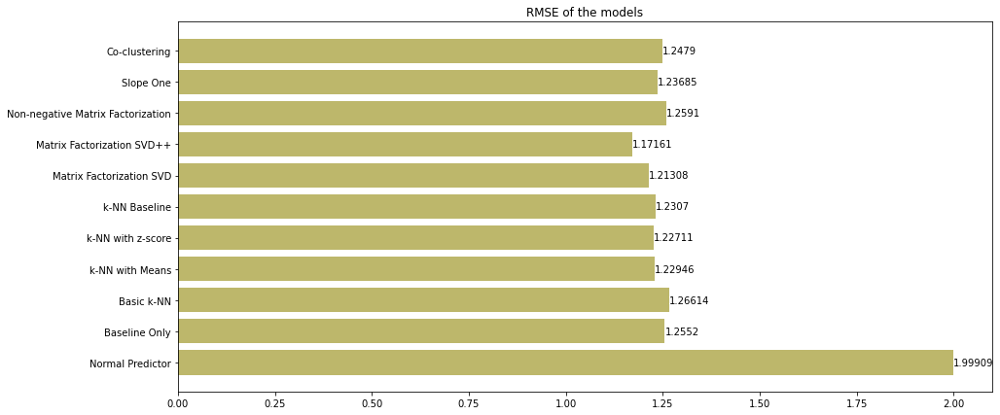

In [45]:
fig, ax = plt.subplots(figsize=(15,7))
bars = ax.barh(performance_df.index, performance_df['RMSE'].values,color='darkkhaki')
ax.set_title('RMSE of the models')
ax.bar_label(bars)
plt.show()

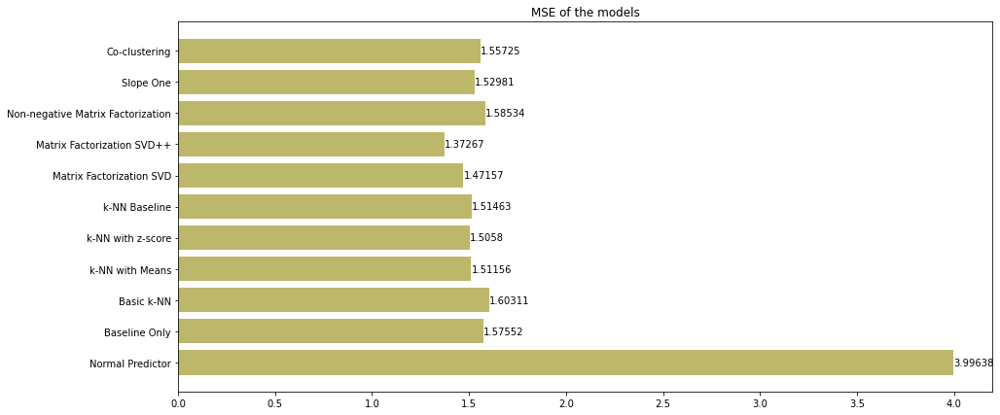

In [46]:
fig, ax = plt.subplots(figsize=(15,7))
bars = ax.barh(performance_df.index, performance_df['MSE'].values,color='darkkhaki')
ax.set_title('MSE of the models')
ax.bar_label(bars)
plt.show()

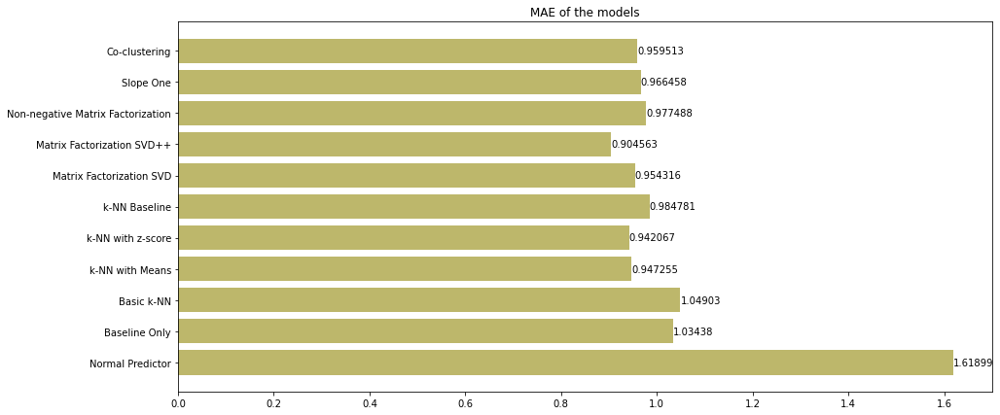

In [47]:
fig, ax = plt.subplots(figsize=(15,7))
bars = ax.barh(performance_df.index, performance_df['MAE'].values,color='darkkhaki')
ax.set_title('MAE of the models')
ax.bar_label(bars)
plt.show()

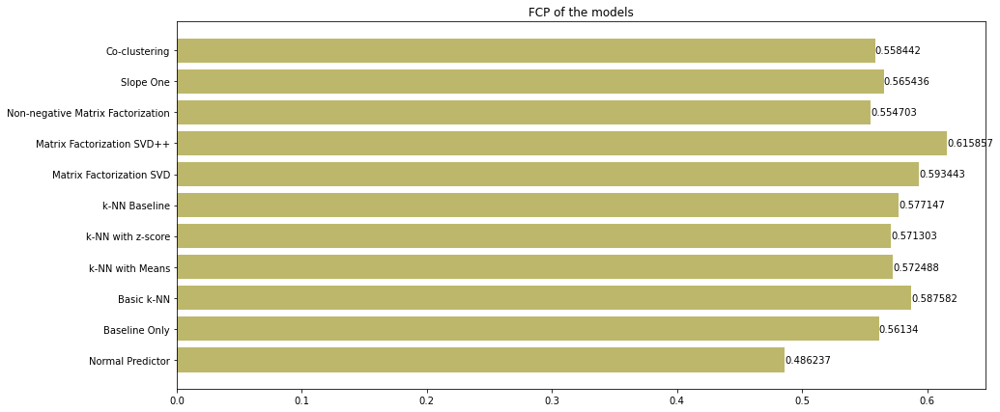

In [48]:
fig, ax = plt.subplots(figsize=(15,7))
bars = ax.barh(performance_df.index, performance_df['FCP'].values,color='darkkhaki')
ax.set_title('FCP of the models')
ax.bar_label(bars)
plt.show()

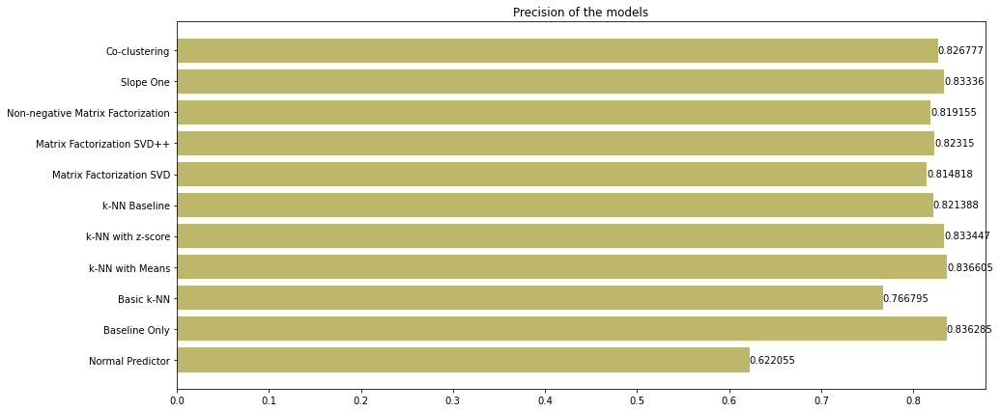

In [49]:
fig, ax = plt.subplots(figsize=(15,7))
bars = ax.barh(performance_df.index, performance_df['precision'].values,color='darkkhaki')
ax.set_title('Precision of the models')
ax.bar_label(bars)
plt.show()

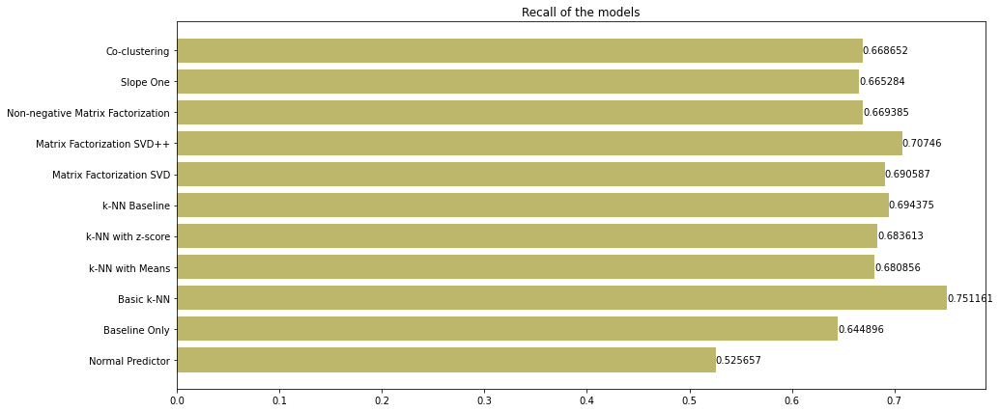

In [50]:
fig, ax = plt.subplots(figsize=(15,7))
bars = ax.barh(performance_df.index, performance_df['recall'].values,color='darkkhaki')
ax.set_title('Recall of the models')
ax.bar_label(bars)
plt.show()

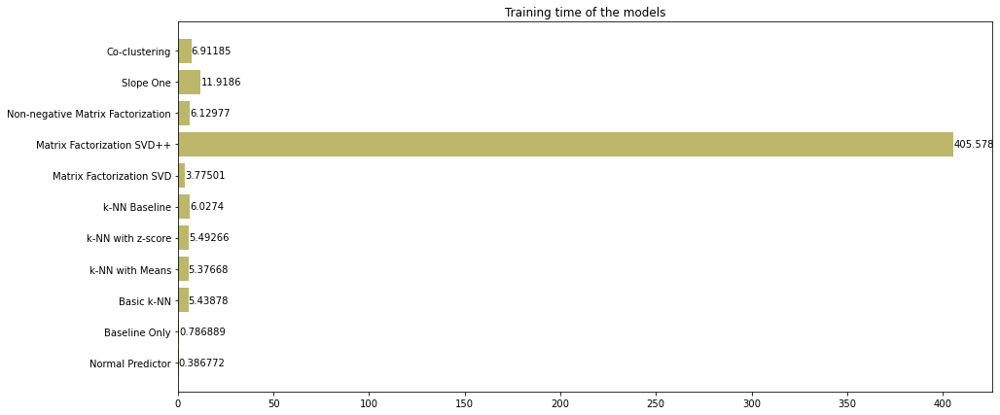

In [51]:
fig, ax = plt.subplots(figsize=(15,7))
bars = ax.barh(performance_df.index, performance_df['training_time'].values,color='darkkhaki')
ax.set_title('Training time of the models')
ax.bar_label(bars)
plt.show()

* Taking all the above metrics into consideration, it seems that the surprise model with the best overall performance is matrix factorization with SVD++, as it has a slight edge compared to the other models in most cases. 
* Its main disadvantage, however, is its large training time - it lasts about 100 times more than the original matrix factorization algorithm with SVD. 
* Therefore, other models might be preferable, like k-NN with z-score, the original matrix factorization algorithm or Slope One which seem to have decent performances. 
* In general, all the remaining models have similar performances except for the normal predictor which has the worst performance as expected, because its predictions are random selections from a normal distribution.

## 7.7 Making recommendations

In this subsection we illustrate how we can make recommendations using surprise models. For this purpose, we deploy the MF with SVD model:

In [52]:
model = surprise.prediction_algorithms.matrix_factorization.SVD(verbose=False)
model.fit(data)
recommendation_lst = [[0,0]] * recommendation_num
train_f = open(train_file_path,"r")
lines = train_f.readlines()
for line in lines:
    pred = model.predict(str(user), line.split()[1], r_ui=None, verbose=False)
    if pred.est > recommendation_lst[recommendation_num-1][1] and line.split()[1] not in [i[0] for i in recommendation_lst]:
        recommendation_lst[recommendation_num-1] = [line.split()[1],pred.est]
        recommendation_lst.sort(key = lambda x: x[1], reverse=True)

print("\n" + "*"*10 + " TOP RECOMMENDATIONS FOR USER %s "%str(user) + "*"*10)
for i in range(recommendation_num):
    print(str(i+1) + ") Song: " + str(recommendation_lst[i][0]) + ", Predicted rating: " +  str(recommendation_lst[i][1]))



********** TOP RECOMMENDATIONS FOR USER 34 **********
1) Song: 2798, Predicted rating: 5
2) Song: 4549, Predicted rating: 5
3) Song: 326, Predicted rating: 5
4) Song: 4939, Predicted rating: 5
5) Song: 4213, Predicted rating: 5
6) Song: 3286, Predicted rating: 5
7) Song: 2869, Predicted rating: 5
8) Song: 2993, Predicted rating: 5
9) Song: 4280, Predicted rating: 5
10) Song: 3898, Predicted rating: 4.999941134069498


## 8. Neural Net models

After completing the evaluation of the surprise models, we experimented with several neural net implementations. These implementations are more complicated in comparison with the previous models. Here we present four of these models, namely AutoRec, NCF, LightGCN and RBM.

In [5]:
training_times_list_nn = [0]*4
RMSE_list_nn = [0]*4
precision_list_nn = [0]*4
recall_list_nn = [0]*4

## 8.1 AutoRec

* This is an autoencoder framework for collaborative filtering to design an item-based or user-based autoencoder. 
* Each user $u \in U = {1...m}$ is represented as a partially observed vector with ratings $r^{(u)} = (R_{u1}...R_{un})$ and the same applies for the items - for each item $i \in I = {1...n}$ there is a partially observed vector with ratings $r^{(i)} = (R_{1i}...R_{mi})$. 
* The model takes these vectors as inputs, projects them into a low-dimensional space and then reconstructs them in the output to predict missing ratings. 

In [6]:
def get_data(num_of_users,num_of_items):
    train_file = open("pipeline/train.txt")
    test_file = open("pipeline/test.txt")
    mat = np.zeros((num_of_users,num_of_items))
    mat_mask = np.zeros((num_of_users,num_of_items))
    for line in train_file.readlines():
        user, item, rating = map(int,line.split("\t"))
        mat[user,item] = rating
        mat_mask[user,item] = 1
    for line in test_file.readlines():
        user, item, rating = map(int,line.split("\t"))
        mat[user,item] = rating
        mat_mask[user,item] = 1
    
    return mat,mat_mask


class Autorec(nn.Module):
    def __init__(self, num_users,num_items,hidden_units,lambda_value):
        super(Autorec, self).__init__()
        self.num_users = num_users
        self.num_items = num_items
        self.hidden_units = hidden_units
        self.lambda_value = lambda_value

        self.encoder = nn.Sequential(
            nn.Linear(self.num_items, self.hidden_units),
            nn.Sigmoid()
        )

        self.decoder = nn.Sequential(
            nn.Linear(self.hidden_units, self.num_items),
        )


    def forward(self,torch_input):

        encoder = self.encoder(torch_input)
        decoder = self.decoder(encoder)

        return decoder

    def loss(self,decoder,input,optimizer,mask_input):
        cost = 0
        temp2 = 0

        cost += (( decoder - input) * mask_input).pow(2).sum()
        rmse = cost

        for i in optimizer.param_groups:
            for j in i['params']:
                if j.data.dim() == 2:
                    temp2 += torch.t(j.data).pow(2).sum()

        cost += temp2 * self.lambda_value * 0.5
        return cost,rmse

In [7]:
def train(epoch,loader,rec,optimizer,train_mask):
    RMSE = 0
    cost_all = 0
    for _, (batch_x, batch_mask_x, _) in enumerate(loader):
        batch_x = batch_x.type(torch.FloatTensor)
        batch_mask_x = batch_mask_x.type(torch.FloatTensor)
        decoder = rec(batch_x)
        loss, rmse = rec.loss(decoder=decoder, input=batch_x, optimizer=optimizer, mask_input=batch_mask_x)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        cost_all += loss
        RMSE += rmse
    RMSE = np.sqrt(RMSE.detach().cpu().numpy() / (train_mask == 1).sum())
    print('epoch ', epoch,  ' train RMSE : ', RMSE)

def test(num_users,num_items,rec,test_r,test_mask):
    test_r_tensor = torch.from_numpy(test_r).type(torch.FloatTensor)
    test_mask_r_tensor = torch.from_numpy(test_mask).type(torch.FloatTensor)
    decoder = rec(test_r_tensor)
    y_preds = (decoder*test_mask_r_tensor).detach().numpy()
    y_true = (test_r_tensor*test_mask_r_tensor).detach().numpy()
    RMSE = recmetrics.rmse(y_preds,y_true)
    
    y_preds = np.ceil(y_preds)
    users, items, rating = [],[],[]
    for user in (range(y_true.shape[0])):
        for item in range(num_items):
            if y_preds[user,item] != 0:
                users.append(user)
                items.append(item)
                rating.append(y_preds[user,item])
    df = pd.DataFrame()
    df["userID"] = users
    df["itemID"] = items
    df["rating"] = rating
    pr = recommender_precision(y_preds,y_true)
    re = recommender_recall(y_preds,y_true)
    return RMSE,pr,re

def make_recommendations_autorec(user,recommendation_num):
    test_r_tensor = torch.from_numpy(r[user]).type(torch.FloatTensor)
    test_mask_r_tensor = torch.from_numpy(r_mask[user]).type(torch.FloatTensor)
    decoder = rec(test_r_tensor)
    recoms = (decoder*test_mask_r_tensor).detach().numpy()
    df = pd.DataFrame()
    df["items"] = np.nonzero(recoms)[0]
    df["ratings"] = recoms[np.where(recoms!=0)]
    df = df.sort_values("ratings",ascending=False)
    recommendations_str = "\n" + "*"*10 + " TOP %d RECOMMENDATIONS FOR USER %s "%(recommendation_num,str(user)) + "*"*10 + "\n"
    i = 1
    for _,item in df.iterrows():
        recommendations_str += (str(i) + ") Song: " + str(int(item['items'])) + ", Predicted rating: " +  str(item['ratings'])) + "\n"
        i += 1
        if(i > recommendation_num):
            break
    return recommendations_str

In [8]:
r, r_mask = get_data(MAX_USERS,MAX_SONGS)
train_r, test_r, train_mask, test_mask = train_test_split(r,r_mask,test_size=0.25,shuffle=True)
torch_dataset = Data.TensorDataset(torch.from_numpy(train_r),torch.from_numpy(train_mask),torch.from_numpy(train_r))
loader = Data.DataLoader(
    dataset=torch_dataset,
    batch_size=10
)
rec = Autorec(MAX_USERS,MAX_SONGS,50,1e-2)
optimizer = optim.Adam(rec.parameters(), lr = 1e-3, weight_decay=1e-4)
tic = time.time()
for i in range(100):
    train(i,loader,rec,optimizer,train_mask)
toc = time.time()
training_times_list_nn[0] = toc - tic
(RMSE_list_nn[0],precision_list_nn[0],recall_list_nn[0]) = test(MAX_USERS,MAX_SONGS,rec,test_r,test_mask)


epoch  0  train RMSE :  2.888636273833204
epoch  1  train RMSE :  1.7260493531649175
epoch  2  train RMSE :  1.5305840021493886
epoch  3  train RMSE :  1.5111679410858676
epoch  4  train RMSE :  1.5074612533193639
epoch  5  train RMSE :  1.5037883493363582
epoch  6  train RMSE :  1.4976069485343741
epoch  7  train RMSE :  1.4830227397123292
epoch  8  train RMSE :  1.465393085196621
epoch  9  train RMSE :  1.437181686309282
epoch  10  train RMSE :  1.4051326677499625
epoch  11  train RMSE :  1.3766212134875306
epoch  12  train RMSE :  1.3499309199136211
epoch  13  train RMSE :  1.325713407443231
epoch  14  train RMSE :  1.3044209863971166
epoch  15  train RMSE :  1.2841997008231585
epoch  16  train RMSE :  1.2663557126999905
epoch  17  train RMSE :  1.2527115945696143
epoch  18  train RMSE :  1.2390124369694453
epoch  19  train RMSE :  1.2255318244259072
epoch  20  train RMSE :  1.2139829329352017
epoch  21  train RMSE :  1.2019690552928735
epoch  22  train RMSE :  1.1907663596415847
ep

In [9]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
print("RMSE: %.4f"%(RMSE_list_nn[0]))
print("Precision: %.4f"%(precision_list_nn[0]))
print("Recall: %.4f"%(recall_list_nn[0]))
print("Training time: %.4f"%(training_times_list_nn[0]))


********** MODEL PERFORMANCE **********
RMSE: 0.4054
Precision: 0.9921
Recall: 0.9921
Training time: 6.0715


In [10]:
print(make_recommendations_autorec(user,recommendation_num))


********** TOP 10 RECOMMENDATIONS FOR USER 34 **********
1) Song: 811, Predicted rating: 5.209208965301514
2) Song: 832, Predicted rating: 4.944906234741211
3) Song: 661, Predicted rating: 4.936517238616943
4) Song: 465, Predicted rating: 4.924215316772461
5) Song: 839, Predicted rating: 4.194476127624512
6) Song: 390, Predicted rating: 4.1629838943481445
7) Song: 66, Predicted rating: 4.078539848327637
8) Song: 331, Predicted rating: 4.065199851989746
9) Song: 979, Predicted rating: 3.9974732398986816
10) Song: 397, Predicted rating: 3.997312545776367



## 8.2 NCF

NCF generalizes Matrix Factorization under its framework, as it tries to learn user-item interactions through a multi-layer perceptron. Its structure consists of the following layers:
* An input layer which binarises a sparse vector for a user and item identification.
* An embedding layer which is a fully connected layer that projects the sparse representation to a dense vector. The obtained user/item embeddings are the latent user/item vectors.
* Neural CF layers which map the latent vectors to prediction scores.
* A final output layer which returns the predicted score by minimizing a loss function.

In [11]:
class NCF_Implementation:
    def __init__(self,train_file_path,test_file_path,max_users,max_items):
        self.train_df = pd.read_csv(train_file_path,delimiter="\t",engine="python",header=None)
        self.train_df.columns=['user_id','song_id','rating']
        self.train_df[['user_id','song_id','rating']].to_csv(train_file_path.split(".")[0]+".csv")
        self.train_data_filepath = train_file_path.split(".")[0]+".csv"
        self.MAX_USERS = max_users
        self.MAX_ITEMS = max_items
        self.test_df = pd.read_csv(test_file_path,delimiter="\t",engine="python",header=None)
        self.test_df.columns=['user_id','song_id','rating']
        self.test_df[['user_id','song_id','rating']].to_csv(test_file_path.split(".")[0]+".csv")
        self.test_data_filepath = test_file_path.split(".")[0]+".csv"

        self.data = NCFDataset(train_file=self.train_data_filepath, test_file=self.test_data_filepath, 
        col_user='user_id', col_item='song_id', col_rating='rating', binary=True, seed=None)


        self.model = NCF(
            n_users=self.data.n_users, 
            n_items=self.data.n_items,
            model_type="NeuMF",
            n_factors=4,
            layer_sizes=[16,8,4],
            n_epochs=10,
            batch_size=50,
            learning_rate=1e-3,
            verbose=1,
            seed=None
        )
    def train(self):
        tic = time.time()
        self.model.fit(self.data)
        toc = time.time()
        self.time_passed = toc - tic
    
    def evaluate(self):
        predictions = []
        for (_, row) in self.test_df.iterrows():
            try:
                predictions.append([row.user_id, row.song_id, row.rating,self.model.predict(int(row.user_id), int(row.song_id))])
            except:
                pass
        predictions = pd.DataFrame(predictions, columns=['user_id', 'song_id', 'rating','prediction'])
        ratings_map = [
            (predictions['prediction'] <= 0.05),
            (predictions['prediction'] > 0.05) & (predictions['prediction'] <= 0.2),
            (predictions['prediction'] > 0.2) & (predictions['prediction'] <= 0.45),
            (predictions['prediction'] > 0.45) & (predictions['prediction'] <= 0.7),
            (predictions['prediction'] > 0.7)
        ]
        predictions['prediction'] = np.select(ratings_map, range(1,6))
        RMSE = rmse(predictions[['user_id','song_id','rating']], predictions[['user_id','song_id','prediction']], col_user='user_id', col_item='song_id')
        pr = precision_at_k(predictions[['user_id','song_id','rating']], predictions[['user_id','song_id','prediction']],\
            col_user='user_id', col_item='song_id',k=20,threshold=3.5)
        re = recall_at_k(predictions[['user_id','song_id','rating']], predictions[['user_id','song_id','prediction']],\
            col_user='user_id', col_item='song_id',k=20,threshold=3.5)
        return RMSE,pr,re,self.time_passed

    def make_recommendations(self,user,recommendation_num):
        l_predictions = []
        l_item_id = []
        l_user = []
        for i in range(self.MAX_ITEMS):
            try:
                l_predictions.append(self.model.predict(user,i))
                l_item_id.append(i)
                l_user.append(user)
            except:
                pass
        
        df = pd.DataFrame()
        df["user"] = l_user
        df["item"] = l_item_id
        df["prediction"] = l_predictions
        ratings_map = [
            (df['prediction'] <= 0.05),
            (df['prediction'] > 0.05) & (df['prediction'] <= 0.2),
            (df['prediction'] > 0.2) & (df['prediction'] <= 0.45),
            (df['prediction'] > 0.45) & (df['prediction'] <= 0.7),
            (df['prediction'] > 0.7)
        ]
        df['prediction'] = np.select(ratings_map, range(1,6))
        df =  df.sort_values("prediction",ascending=False)
        recommendations_str = "\n" + "*"*10 + " TOP %d RECOMMENDATIONS FOR USER %s "%(recommendation_num,str(user)) + "*"*10 + "\n"
        i = 1
        for _,item in df.iterrows():
            recommendations_str += (str(i) + ") Song: " + str(int(item['item'])) + ", Predicted rating: " +  str(item['prediction'])) + "\n"
            i += 1
            if i > recommendation_num:
                break
        
        return recommendations_str

In [12]:
p = NCF_Implementation("pipeline/train.txt","pipeline/test.txt",MAX_USERS,MAX_SONGS)
p.train()
(RMSE_list_nn[1],precision_list_nn[1],recall_list_nn[1],training_times_list_nn[1]) = p.evaluate()

INFO:recommenders.models.ncf.dataset:Indexing pipeline/train.csv ...
INFO:recommenders.models.ncf.dataset:Indexing pipeline/test.csv ...
INFO:recommenders.models.ncf.dataset:Indexing pipeline/test_full.csv ...
/home/nikos/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/base_layer_v1.py:1719: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
2023-01-27 23:35:03.952339: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-27 23:35:03.952961: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-01-

In [13]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
print("RMSE: %.4f"%(RMSE_list_nn[1]))
print("Precision: %.4f"%(precision_list_nn[1]))
print("Recall: %.4f"%(recall_list_nn[1]))
print("Training time: %.4f"%(training_times_list_nn[1]))


********** MODEL PERFORMANCE **********
RMSE: 1.8182
Precision: 0.1490
Recall: 1.0000
Training time: 125.8348


## 8.3 LightGCN

* GCNs are designed for general graph classification tasks and incorporate many neural network operations. 
* In collaborative filtering some of these operations, like feature transformation and nonlinear activation, make these models impractical. 
* Therefore, LightGCN is a suitable alternative which includes only neighborhood aggregation. 
* More specifically, it learns user and item embeddings by linearly propagating them on the user-item interaction graph  and the weighted sum of the embeddings from the previous layers is used as the final embedding.

In [14]:
class LightGCN_Implementation:
    def __init__(self,MAX_USERS) -> None:
        train_df = pd.read_csv("pipeline/train.txt",delimiter="\t",header=None,engine="python")
        train_df.columns = ["userID","itemID","rating"]

        test_df = pd.read_csv("pipeline/test.txt",delimiter="\t",header=None,engine="python")
        test_df.columns = ["userID","itemID","rating"]

        self.df = pd.concat([train_df,test_df],axis=0,ignore_index=True)
        self.TOP_K = 100
        self.MAX_USERS = MAX_USERS
        EPOCHS = 10
        BATCH_SIZE = 10
        self.train, self.test = python_stratified_split(self.df, ratio=0.75)
        SEED = DEFAULT_SEED
        self.data = ImplicitCF(train=self.train, test=self.test, seed=SEED)

        hparams = prepare_hparams("lightgcn.yaml",
                          n_layers=3,
                          batch_size=BATCH_SIZE,
                          epochs=EPOCHS,
                          learning_rate=0.005,
                          eval_epoch=5,
                          top_k=self.TOP_K,
                         )
        self.model = LightGCN(hparams, self.data, seed=SEED)

    def trainGCN(self):
        with Timer() as train_time:
            self.model.fit()
        return train_time.interval

    def evaluate(self):
        topk_scores = self.model.recommend_k_items(self.test, top_k=self.TOP_K, remove_seen=True)
        precision = precision_at_k(self.test, topk_scores, k=self.TOP_K)
        recall = recall_at_k(self.test, topk_scores, k=self.TOP_K)
        RMSE = rmse(self.test, topk_scores)
        return (RMSE,precision,recall)
    
    def make_recommendations(self,user,number_of_recommendations):
        recommendations_str = "\n" + "*"*10 + " TOP %d RECOMMENDATIONS FOR USER %s "%(number_of_recommendations,str(user)) + "*"*10 + "\n"
        predictions = self.model.recommend_k_items(self.df,top_k=number_of_recommendations,remove_seen=True)
        u_df = predictions[predictions['userID'] == user]
        i = 0
        for _,item in u_df.iterrows():
            if(item['prediction'] > 5): item['prediction'] = 5
            recommendations_str += (str(i+1) + ") Song: " + str(int(item['itemID'])) + ", Predicted rating: " +  str(item['prediction'])) + "\n"
            i += 1
        return recommendations_str

In [15]:
p = LightGCN_Implementation(MAX_USERS)
training_times_list_nn[2] = p.trainGCN()
(RMSE_list_nn[2],precision_list_nn[2],recall_list_nn[2]) = p.evaluate()

Already create adjacency matrix.
Already normalize adjacency matrix.
Using xavier initialization.


2023-01-27 23:37:13.093594: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-27 23:37:13.093748: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1650 computeCapability: 7.5
coreClock: 1.665GHz coreCount: 14 deviceMemorySize: 3.80GiB deviceMemoryBandwidth: 119.24GiB/s
2023-01-27 23:37:13.093806: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-01-27 23:37:13.093825: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-01-27 23:37:13.093834: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.10
2023-01-27 23:37:13.093842: I tensorflow/stream_executo

Epoch 1 (train)20.5s: train loss = 0.38529 = (mf)0.38343 + (embed)0.00185
Epoch 2 (train)21.2s: train loss = 0.26578 = (mf)0.26177 + (embed)0.00401
Epoch 3 (train)20.5s: train loss = 0.21590 = (mf)0.21018 + (embed)0.00573
Epoch 4 (train)19.8s: train loss = 0.17853 = (mf)0.17106 + (embed)0.00748
Epoch 5 (train)20.7s + (eval)0.4s: train loss = 0.15596 = (mf)0.14684 + (embed)0.00912, recall = 0.48800, precision = 0.07074
Epoch 6 (train)20.5s: train loss = 0.13869 = (mf)0.12806 + (embed)0.01064
Epoch 7 (train)20.3s: train loss = 0.12436 = (mf)0.11233 + (embed)0.01203
Epoch 8 (train)20.1s: train loss = 0.11555 = (mf)0.10225 + (embed)0.01329
Epoch 9 (train)20.9s: train loss = 0.10609 = (mf)0.09169 + (embed)0.01440
Epoch 10 (train)19.8s + (eval)0.4s: train loss = 0.09830 = (mf)0.08291 + (embed)0.01539, recall = 0.45401, precision = 0.06706


In [16]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
print("RMSE: %.4f"%(RMSE_list_nn[2]))
print("Precision: %.4f"%(precision_list_nn[2]))
print("Recall: %.4f"%(recall_list_nn[2]))
print("Training time: %.4f"%(training_times_list_nn[2]))


********** MODEL PERFORMANCE **********
RMSE: 2.0594
Precision: 0.0671
Recall: 0.4540
Training time: 205.1366


In [17]:
print(p.make_recommendations(user,recommendation_num))


********** TOP 10 RECOMMENDATIONS FOR USER 34 **********
1) Song: 553, Predicted rating: 5.0
2) Song: 456, Predicted rating: 5.0
3) Song: 273, Predicted rating: 5.0
4) Song: 862, Predicted rating: 5.0
5) Song: 742, Predicted rating: 5.0
6) Song: 604, Predicted rating: 5.0
7) Song: 171, Predicted rating: 5.0
8) Song: 421, Predicted rating: 5.0
9) Song: 72, Predicted rating: 5.0
10) Song: 793, Predicted rating: 5.0



## 8.4 RBM

* Boltzmann Machines are unsupervised neural networks which have no output layers, no direction between connections and every one of its neurons is densely connected to each other, even between input nodes. 
* Compared to the full Boltzmann Machines, Restricted Boltzmann Machines (RBMs) do not allow connections between hidden nodes and connections between visible nodes. 
* To achieve their functionality, they accept inputs from visible nodes into hidden nodes. Then they try to reconstruct the input values based on hidden node values. If they fail, they adjust their weights and reconstruct the input.

In [18]:
class RBM_Implementation(object):
    def __init__(self,max_users):
        train_df = pd.read_csv("pipeline/train.txt",delimiter="\t",header=None,engine="python")
        train_df.columns = ["user_id","song_id","rating"]
        self.MAX_USERS = max_users
        test_df = pd.read_csv("pipeline/test.txt",delimiter="\t",header=None,engine="python")
        test_df.columns = ["user_id","song_id","rating"]

        data = pd.concat([train_df,test_df],axis=0,ignore_index=True)
        header = {
                "col_user": "user_id",
                "col_item": "song_id",
                "col_rating": "rating",
            }
        self.am = AffinityMatrix(df = data, **header)
        self.X, _, _ = self.am.gen_affinity_matrix()
        self.Xtr, self.Xtst = numpy_stratified_split(self.X)
        self.model = RBM(
            possible_ratings=np.setdiff1d(np.unique(self.Xtr), np.array([0])),
            visible_units=self.Xtr.shape[1],
            hidden_units=600,
            training_epoch=100,
            minibatch_size=60,
            keep_prob=0.9,
            with_metrics=True
        )
    def train(self):
        tic = time.time()
        self.model.fit(self.Xtr)
        toc = time.time()
        return float(toc-tic)

    def evaluate(self):
        K = 10
        top_k =  self.model.recommend_k_items(self.Xtst)
        top_k_df = self.am.map_back_sparse(top_k, kind = 'prediction')
        test_df = self.am.map_back_sparse(self.Xtst, kind = 'ratings')
        precision = precision_at_k(test_df, top_k_df, col_user="user_id", col_item="song_id", 
                               col_rating="rating", col_prediction="prediction", 
                               relevancy_method="top_k", k= K)

        recall = recall_at_k(test_df, top_k_df, col_user="user_id", col_item="song_id", 
                            col_rating="rating", col_prediction="prediction", 
                            relevancy_method="top_k", k= K)
        RMSE = rmse(test_df, top_k_df, col_user="user_id", col_item="song_id", 
                            col_rating="rating", col_prediction="prediction")
        return (RMSE,precision,recall)

    def make_recommendations(self,user,recommendation_num):
        top_k =  self.model.recommend_k_items(self.X,top_k=recommendation_num)
        df = self.am.map_back_sparse(top_k, kind = 'prediction')
        recommendations_str = "\n" + "*"*10 + " TOP %d RECOMMENDATIONS FOR USER %s "%(recommendation_num,str(user)) + "*"*10 + "\n"
        u_df = df[df['user_id'] == user].sort_values('prediction',ascending=False)
        i = 0
        for _,item in u_df.iterrows():
            recommendations_str += (str(i+1) + ") Song: " + str(int(item['song_id'])) + ", Predicted rating: " +  str(item['prediction'])) + "\n"
            i += 1
        return recommendations_str

In [19]:
p = RBM_Implementation(MAX_USERS)
training_times_list_nn[3] = p.train()
(RMSE_list_nn[3],precision_list_nn[3],recall_list_nn[3]) = p.evaluate()

INFO:recommenders.datasets.sparse:Generating the user/item affinity matrix...
INFO:recommenders.datasets.sparse:Matrix generated, sparseness percentage: 93
INFO:recommenders.models.rbm.rbm:Creating the computational graph
INFO:recommenders.models.rbm.rbm:Initialize Gibbs protocol


Instructions for updating:
Deprecated in favor of operator or tf.math.divide.


Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
2023-01-27 23:40:39.285817: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-01-27 23:40:39.285987: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-27 23:40:39.286106: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1650 computeCapability: 7.5
coreClock: 1.665GHz coreCount: 14 deviceMemorySize: 3.80GiB deviceMemoryBandwidth: 119.24GiB/s
2023-01-27 23:40:39.286148: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-01-27 23:40:39.286167: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library lib

INFO:recommenders.models.rbm.rbm:training epoch 0 rmse 2.029658
INFO:recommenders.models.rbm.rbm:training epoch 10 rmse 1.770117
INFO:recommenders.models.rbm.rbm:training epoch 20 rmse 1.677598
INFO:recommenders.models.rbm.rbm:training epoch 30 rmse 1.608691
INFO:recommenders.models.rbm.rbm:training epoch 40 rmse 1.583374
INFO:recommenders.models.rbm.rbm:training epoch 50 rmse 1.550781
INFO:recommenders.models.rbm.rbm:training epoch 60 rmse 1.513325
INFO:recommenders.models.rbm.rbm:training epoch 70 rmse 1.487200
INFO:recommenders.models.rbm.rbm:training epoch 80 rmse 1.458534
INFO:recommenders.models.rbm.rbm:training epoch 90 rmse 1.438277
INFO:recommenders.models.rbm.rbm:training epoch 100 rmse 1.399907
INFO:recommenders.models.rbm.rbm:Extracting top 10 elements


In [20]:
#Evaluating the performance of the model
print("\n" + "*"*10 + " MODEL PERFORMANCE " + "*"*10)
print("RMSE: %.4f"%(RMSE_list_nn[3]))
print("Precision: %.4f"%(precision_list_nn[3]))
print("Recall: %.4f"%(recall_list_nn[3]))
print("Training time: %.4f"%(training_times_list_nn[3]))


********** MODEL PERFORMANCE **********
RMSE: 0.8675
Precision: 0.5439
Recall: 0.5411
Training time: 4.7323


In [21]:
print(p.make_recommendations(user,recommendation_num))

INFO:recommenders.models.rbm.rbm:Extracting top 10 elements



********** TOP 10 RECOMMENDATIONS FOR USER 34 **********
1) Song: 331, Predicted rating: 4.545690536499023
2) Song: 979, Predicted rating: 4.295838356018066
3) Song: 362, Predicted rating: 4.294561386108398
4) Song: 432, Predicted rating: 3.796065092086792
5) Song: 977, Predicted rating: 3.6459591388702393
6) Song: 65, Predicted rating: 2.7294111251831055
7) Song: 483, Predicted rating: 2.5943634510040283
8) Song: 247, Predicted rating: 2.339779853820801
9) Song: 578, Predicted rating: 2.2406322956085205
10) Song: 601, Predicted rating: 2.153656244277954



## 8.5 Performance comparison

In [22]:
perf_list_nn = [[RMSE_list_nn[i],precision_list_nn[i],recall_list_nn[i],training_times_list_nn[i]] for i in range(4)]
performance_nn_df = pd.DataFrame(perf_list_nn, columns = ['RMSE','precision','recall','training_time'])
performance_nn_df = performance_nn_df.set_index(pd.Index(['AutoRec','NCF','LightGCN','RBM']))
performance_nn_df

,RMSE,precision,recall,training_time
AutoRec,0.405434,0.992072,0.992072,6.071530
NCF,1.818207,0.148952,1.000000,125.834759
LightGCN,2.059358,0.067059,0.454007,205.136551
RBM,0.867451,0.543900,0.541112,4.732290


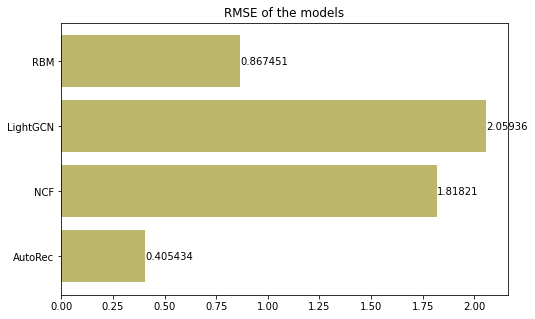

In [23]:
fig, ax = plt.subplots(figsize=(8,5))
bars = ax.barh(performance_nn_df.index, performance_nn_df['RMSE'].values,color='darkkhaki')
ax.set_title('RMSE of the models')
ax.bar_label(bars)
plt.show()

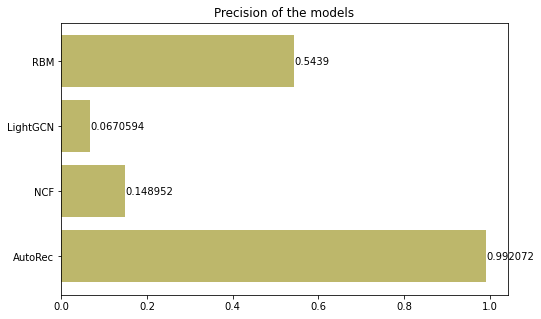

In [24]:
fig, ax = plt.subplots(figsize=(8,5))
bars = ax.barh(performance_nn_df.index, performance_nn_df['precision'].values,color='darkkhaki')
ax.set_title('Precision of the models')
ax.bar_label(bars)
plt.show()

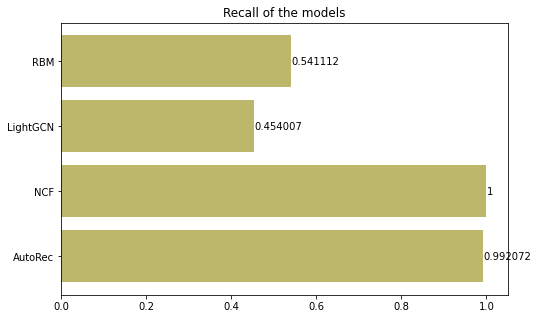

In [25]:
fig, ax = plt.subplots(figsize=(8,5))
bars = ax.barh(performance_nn_df.index, performance_nn_df['recall'].values,color='darkkhaki')
ax.set_title('Recall of the models')
ax.bar_label(bars)
plt.show()

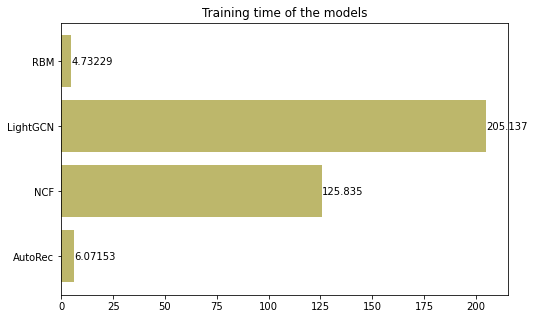

In [26]:
fig, ax = plt.subplots(figsize=(8,5))
bars = ax.barh(performance_nn_df.index, performance_nn_df['training_time'].values,color='darkkhaki')
ax.set_title('Training time of the models')
ax.bar_label(bars)
plt.show()

* AutoRec generally outperforms the rest of the models in all metrics and also requires little training time. 
* RBM seems to be the next most well performing model and needs even less time for its training in comparison with AutoRec. 
* Finally, LightGCN and NCF cannot be recommended based on our results, as they are slow and do not perform well.

## 9. Conclusions

* Based on our work, we reached the conclusion that matrix factorization with SVD++ is the best performing model among the surprise models despite the fact that it needs much more training time compared to the other models.
* On the other hand, AutoRec is the best performing model among the neural nets and seems to outperform the surprise models as well, so it is the best implementation which we examined for the purposes of this project.